# Surface Energy Budget Analysis
This notebook creates all figures relevate to the surface energy budget analysis. The accompanying notebook that generates the data for these figures is surface_energy_budget.ipynb

1. Group Models According to Magnitude of SO-EPT coupling
2. Group Models According to Magnitude of SWCF_EPSA
3. Normal 1-sigma SO cooling

This notebook creates:
1. **Figure 3**: SEB composites of 1-sigma NET EPT cooling
2. **Figure 4**: SEB composites of High and Low SWCF on 1-sigma NET EPT cooling
3. **Figure S3**: LH_RH, LH_Winds, LH_DT composites of 1-sigma NET EPT cooling
4. One figure showing NON_CLOUD components with EIS (1 figure)
5. One figure for SW_CLD, LH and NET for CMIP5/6 for each model (6 figures)

## Util Functions

In [1]:
import os
import xarray as xr
import numpy as np
import xcdat as xc
import xskillscore as xscore
import cartopy.crs as ccrs
import cartopy
import matplotlib.pyplot as plt
from scipy.stats import linregress
import pandas as pd
from typing import Tuple, List

from matplotlib.gridspec import GridSpec

import warnings
from dask.array.core import PerformanceWarning
# Suppress only RuntimeWarnings (like "invalid value encountered in divide")
warnings.filterwarnings("ignore", category=RuntimeWarning) ## Suppress skillscore/core/np_deterministic.py:202: RuntimeWarning: invalid value encountered in divide res = s_num / s_den
warnings.filterwarnings("ignore", category=PerformanceWarning)

In [2]:
# Change current working directory
os.chdir('/home/espinosa10/tropical_pacific_clouds')

In [3]:
def get_triangle(tos, latmin: float = -38.75, latmax: float = -1.25, lonmin: float = -178.75, lonmax: float = -71.25, RES: float = 2.5):
    DY = latmax - latmin
    DX = lonmax - lonmin 
    dx = RES*round(DX/DY)
    dy = RES

    # print(f"For each latitude step of {dy} degrees, longitude step is {dx}")

    latcoords = np.arange(latmax, latmin-dy, -dy)
    loncoords = np.arange(lonmin, lonmax+dx, dx)
    lonraw = np.arange(lonmin, lonmax+dx, RES)

    # Swap order of dimensions in tos
    tos = tos.transpose('model', 'time', 'lat', 'lon')
    ctos = tos.sel(lon=slice(lonmin, lonmax), lat=slice(latmin, latmax))
    nmodel, ntime, _, nlon = ctos.shape
    # print(ctos)

    for i, clon in enumerate(lonraw):
        j = np.where(clon == loncoords)[0]

        if i == nlon: break

        if len(j) == 0: 
            j = jold
        else: 
            j = j[0]
             
        nlats = int(len(latcoords) - j) # nlats below diag
        ctos[:,:,:nlats,i] = np.full((nmodel, ntime, nlats), np.nan) 
        
        jold = j
    
    return ctos

## Load SEB and SWCF Data

Load SEB data

In [4]:
def fix_coords(data):
    data = data.bounds.add_bounds("X")
    data = data.bounds.add_bounds("Y")
    data = data.bounds.add_bounds("T")
    data = xc.swap_lon_axis(data, to=(-180, 180))
    return data

In [5]:
root_dir = "/home/espinosa10/tropical_pacific_clouds/cloud_masking"
cmip6_files = [os.path.join(root_dir, "cmip6",file) for file in os.listdir(os.path.join(root_dir, "cmip6")) if file.startswith("SEB")]
cmip5_files = [os.path.join(root_dir, "cmip5",file) for file in os.listdir(os.path.join(root_dir, "cmip5")) if file.startswith("SEB")]
cmip_files = cmip6_files + cmip5_files
CM_CMIP = xr.open_mfdataset(cmip_files, combine='nested', concat_dim='model')
CM_CMIP[['ALB', 'HS_PL', 'HS_LR', 'HS_RH', 'CLD_SW', 'CLD_LW', 'RESID_NET']] *= 3 # Convert from decadal to 30 year trends
CM_CMIP["NON_CLOUD_CM"] = CM_CMIP["ALB"] + CM_CMIP["HS_PL"] + CM_CMIP["HS_LR"] + CM_CMIP["HS_RH"] + CM_CMIP["RESID_NET"]
CM_CMIP["CLOUD_CM"] = CM_CMIP["CLD_SW"] + CM_CMIP["CLD_LW"]
CM_CMIP = fix_coords(CM_CMIP)
CM_CMIP

<xarray.Dataset>
Dimensions:       (time: 120, lon: 144, lat: 72, model: 66, bnds: 2)
Coordinates:
  * time          (time) int64 0 1 2 3 4 5 6 7 ... 113 114 115 116 117 118 119
  * lon           (lon) float64 -178.8 -176.2 -173.8 ... 173.8 176.2 178.8
  * lat           (lat) float64 -88.75 -86.25 -83.75 ... 83.75 86.25 88.75
  * model         (model) <U16 'ACCESS-ESM1-5' 'CESM2-FV2' ... 'CESM1-BGC'
Dimensions without coordinates: bnds
Data variables:
    ALB           (model, time, lat, lon) float64 dask.array<chunksize=(1, 120, 72, 144), meta=np.ndarray>
    HS_PL         (model, time, lat, lon) float64 dask.array<chunksize=(1, 120, 72, 144), meta=np.ndarray>
    HS_LR         (model, time, lat, lon) float64 dask.array<chunksize=(1, 120, 72, 144), meta=np.ndarray>
    HS_RH         (model, time, lat, lon) float64 dask.array<chunksize=(1, 120, 72, 144), meta=np.ndarray>
    CLD_SW        (model, time, lat, lon) float64 dask.array<chunksize=(1, 120, 72, 144), meta=np.ndarray>
    CLD_LW        (model, time, lat, lon) float64 dask.array<chunksize=(1, 120, 72, 144), meta=np.ndarray>
    RESID_NET     (model, time, lat, lon) float64 dask.array<chunksize=(1, 120, 72, 144), meta=np.ndarray>
    NON_CLOUD_CM  (model, time, lat, lon) float64 dask.array<chunksize=(1, 120, 72, 144), meta=np.ndarray>
    CLOUD_CM      (model, time, lat, lon) float64 dask.array<chunksize=(1, 120, 72, 144), meta=np.ndarray>
    lon_bnds      (lon, bnds) float64 -180.0 -177.5 -177.5 ... 177.5 -180.0
    lat_bnds      (lat, bnds) float64 -90.0 -87.5 -87.5 -85.0 ... 87.5 87.5 90.0
    time_bnds     (time, bnds) float64 -0.5 0.5 0.5 1.5 ... 118.5 118.5 119.5

In [6]:
SEB_CMIP6 = xr.open_dataset("data/piControl/SEB_CMIP6_full_expanded.nc")*3 
SEB_CMIP5 = xr.open_dataset("data/piControl/SEB_CMIP5_full_expanded.nc")*3
SEB_CMIP6["NON_CLOUD"] = SEB_CMIP6["SW_Other"] + SEB_CMIP6["LW_Other"]
SEB_CMIP5["NON_CLOUD"] = SEB_CMIP5["SW_Other"] + SEB_CMIP5["LW_Other"]
SEB_CMIP6 = fix_coords(SEB_CMIP6)
SEB_CMIP5 = fix_coords(SEB_CMIP5)
shared_models_cmip6 = SEB_CMIP6.model.values
shared_models_cmip5 = SEB_CMIP5.model.values

ERA = "CMIP6"
U10_CMIP6 = xr.open_dataarray(f"data/piControl/rolling_gradient_U10_{ERA}.nc") #*3
V10_CMIP6 = xr.open_dataarray(f"data/piControl/rolling_gradient_V10_{ERA}.nc") #*3
U10_CMIP6 = fix_coords(U10_CMIP6.rename("U10").to_dataset())
V10_CMIP6 = fix_coords(V10_CMIP6.rename("V10").to_dataset())

TAUU_CMIP6 = xr.open_dataarray(f"data/piControl/rolling_gradient_TAUU_{ERA}.nc")
TAUV_CMIP6 = xr.open_dataarray(f"data/piControl/rolling_gradient_TAUV_{ERA}.nc")
TAUU_CMIP6 = fix_coords(TAUU_CMIP6.rename("TAUU").to_dataset())
TAUV_CMIP6 = fix_coords(TAUV_CMIP6.rename("TAUV").to_dataset())

USURF_CMIP6 = xr.open_dataarray(f"data/piControl/rolling_gradient_USURF_{ERA}.nc") #*3
VSURF_CMIP6 = xr.open_dataarray(f"data/piControl/rolling_gradient_VSURF_{ERA}.nc") #*3
USURF_CMIP6 = fix_coords(USURF_CMIP6.rename("USURF").to_dataset())
VSURF_CMIP6 = fix_coords(VSURF_CMIP6.rename("VSURF").to_dataset())

PSL_CMIP6 = xr.open_dataarray(f"data/piControl/rolling_gradient_PSL_{ERA}.nc") #*3
PSL_CMIP6 = fix_coords(PSL_CMIP6.rename("PSL").to_dataset())
 
ERA = "CMIP5"
U10_CMIP5 = xr.open_dataarray(f"data/piControl/rolling_gradient_U10_{ERA}.nc") #*3
V10_CMIP5 = xr.open_dataarray(f"data/piControl/rolling_gradient_V10_{ERA}.nc") #*3
U10_CMIP5 = fix_coords(U10_CMIP5.rename("U10").to_dataset())
V10_CMIP5 = fix_coords(V10_CMIP5.rename("V10").to_dataset())

TAUU_CMIP5 = xr.open_dataarray(f"data/piControl/rolling_gradient_TAUU_{ERA}.nc")
TAUV_CMIP5 = xr.open_dataarray(f"data/piControl/rolling_gradient_TAUV_{ERA}.nc")
TAUU_CMIP5 = fix_coords(TAUU_CMIP5.rename("TAUU").to_dataset())
TAUV_CMIP5 = fix_coords(TAUV_CMIP5.rename("TAUV").to_dataset())

USURF_CMIP5 = xr.open_dataarray(f"data/piControl/rolling_gradient_USURF_{ERA}.nc") #*3
VSURF_CMIP5 = xr.open_dataarray(f"data/piControl/rolling_gradient_VSURF_{ERA}.nc") #*3
USURF_CMIP5 = fix_coords(USURF_CMIP5.rename("USURF").to_dataset())
VSURF_CMIP5 = fix_coords(VSURF_CMIP5.rename("VSURF").to_dataset())

PSL_CMIP5 = xr.open_dataarray(f"data/piControl/rolling_gradient_PSL_{ERA}.nc") #*3
PSL_CMIP5 = fix_coords(PSL_CMIP5.rename("PSL").to_dataset())

# Combine CMIP6 and CMIP5
SEB_CMIP = xr.concat([SEB_CMIP6, SEB_CMIP5], dim="model")
U10_CMIP = xr.concat([U10_CMIP6, U10_CMIP5], dim="model")
V10_CMIP = xr.concat([V10_CMIP6, V10_CMIP5], dim="model")
USURF_CMIP = xr.concat([USURF_CMIP6, USURF_CMIP5], dim="model")
VSURF_CMIP = xr.concat([VSURF_CMIP6, VSURF_CMIP5], dim="model")
PSL_CMIP = xr.concat([PSL_CMIP6, PSL_CMIP5], dim="model")
TAUU_CMIP = xr.concat([TAUU_CMIP6, TAUU_CMIP5], dim="model")
TAUV_CMIP = xr.concat([TAUV_CMIP6, TAUV_CMIP5], dim="model")

print(len(SEB_CMIP.model.values), SEB_CMIP.model.values) # 62 models
print(len(U10_CMIP.model.values), U10_CMIP.model.values) # 70 models
print(len(USURF_CMIP.model.values), USURF_CMIP.model.values) # 100 models
print(len(PSL_CMIP.model.values), PSL_CMIP.model.values) # 100 models
SEB_CMIP = SEB_CMIP.drop(["lat_bnds", "lon_bnds", "time_bnds"])
SEB_CMIP = fix_coords(SEB_CMIP)

62 ['GISS-E2-1-G' 'EC-Earth3-Veg' 'CESM2-WACCM-FV2' 'EC-Earth3-CC' 'NESM3'
 'E3SM-1-1' 'FGOALS-f3-L' 'INM-CM4-8' 'E3SM-2-0' 'GISS-E2-1-H'
 'MRI-ESM2-0' 'CESM2-WACCM' 'IPSL-CM6A-LR' 'CESM2' 'BCC-CSM2-MR'
 'GFDL-CM4' 'MIROC6' 'GISS-E2-2-H' 'MPI-ESM1-2-HR' 'EC-Earth3-Veg-LR'
 'FIO-ESM-2-0' 'HadGEM3-GC31-LL' 'E3SM-1-0' 'CanESM5' 'IITM-ESM'
 'NorESM1-F' 'INM-CM5-0' 'MPI-ESM-1-2-HAM' 'GFDL-ESM4' 'CanESM5-1'
 'CAS-ESM2-0' 'CMCC-CM2-SR5' 'HadGEM3-GC31-MM' 'CMCC-ESM2' 'EC-Earth3'
 'SAM0-UNICON' 'BCC-ESM1' 'MPI-ESM1-2-LR' 'EC-Earth3-LR' 'inmcm4'
 'MIROC-ESM-CHEM' 'GFDL-CM3' 'GFDL-ESM2M' 'MRI-CGCM3' 'IPSL-CM5A-LR'
 'HadGEM2-CC' 'ACCESS1-3' 'GFDL-ESM2G' 'CSIRO-Mk3-6-0' 'MPI-ESM-MR'
 'MPI-ESM-LR' 'GISS-E2-R-CC' 'MPI-ESM-P' 'CNRM-CM5-2' 'CNRM-CM5'
 'IPSL-CM5B-LR' 'GISS-E2-H-CC' 'IPSL-CM5A-MR' 'GISS-E2-H' 'MIROC-ESM'
 'CanESM2' 'ACCESS1-0']
76 ['KIOST-ESM' 'CIESM' 'BCC-ESM1' 'BCC-CSM2-MR' 'FGOALS-f3-L' 'CAS-ESM2-0'
 'HadGEM3-GC31-LL' 'HadGEM3-GC31-MM' 'GFDL-ESM4' 'GFDL-CM4'
 'GISS-E2-1-G-CC' 'GISS-E2

Get SWCF EPSA Data

In [7]:
def get_shared_models(ds1: xr.Dataset, ds2: xr.Dataset) -> Tuple[xr.Dataset, xr.Dataset]:
    shared_models = list(set(ds1.model.values).intersection(set(ds2.model.values)))
    print(shared_models)
    return ds1.sel(model=shared_models), ds2.sel(model=shared_models)
    
SWCF_CMIP6 = xr.open_dataarray("data/piControl/swcf_east_sa_cmip6_v3.nc")
SWCF_CMIP5 = xr.open_dataarray("data/piControl/swcf_east_sa_cmip5_v3.nc")
SWCF_CMIP = xr.concat([SWCF_CMIP6, SWCF_CMIP5], dim="model")
# SWCF_CMIP # 81 models

Get shared that have data for SEB calculations and SWCF

In [8]:
USURF_CMIP = USURF_CMIP.drop(["lat_bnds", "lon_bnds", "time_bnds"])
VSURF_CMIP = VSURF_CMIP.drop(["lat_bnds", "lon_bnds", "time_bnds"])
PSL_CMIP = PSL_CMIP.drop(["lat_bnds", "lon_bnds", "time_bnds"])

In [9]:
CM_CMIP, SEB_CMIP = get_shared_models(CM_CMIP, SEB_CMIP)
USURF_CMIP, SEB_CMIP = get_shared_models(USURF_CMIP, SEB_CMIP)
VSURF_CMIP, SEB_CMIP = get_shared_models(VSURF_CMIP, SEB_CMIP)
PSL_CMIP, SEB_CMIP = get_shared_models(PSL_CMIP, SEB_CMIP)

SEB_CMIP = xr.merge([SEB_CMIP, USURF_CMIP, VSURF_CMIP, PSL_CMIP, CM_CMIP])
SEB_CMIP = SEB_CMIP.sortby('model')
models = SEB_CMIP.model.values
models = [model for model in models if model != "MPI-ESM1-2-HR"] # DROP MPI-ESM1-2-HR (BAD MODEL)
SEB_CMIP = SEB_CMIP.sel(model=models)

SWCF_CMIP, SEB_CMIP = get_shared_models(SWCF_CMIP, SEB_CMIP)

['FGOALS-f3-L', 'E3SM-1-0', 'BCC-CSM2-MR', 'MPI-ESM-1-2-HAM', 'MRI-ESM2-0', 'GFDL-CM3', 'CanESM5', 'MIROC6', 'EC-Earth3-Veg', 'EC-Earth3-CC', 'INM-CM5-0', 'EC-Earth3-Veg-LR', 'SAM0-UNICON', 'HadGEM2-CC', 'CNRM-CM5-2', 'HadGEM3-GC31-LL', 'CESM2-WACCM', 'inmcm4', 'E3SM-2-0', 'MIROC-ESM-CHEM', 'NorESM1-F', 'GISS-E2-1-H', 'GISS-E2-1-G', 'GISS-E2-2-H', 'GFDL-CM4', 'CMCC-CM2-SR5', 'MIROC-ESM', 'EC-Earth3-LR', 'IITM-ESM', 'CESM2-WACCM-FV2', 'INM-CM4-8', 'CanESM5-1', 'IPSL-CM5B-LR', 'ACCESS1-0', 'CMCC-ESM2', 'ACCESS1-3', 'HadGEM3-GC31-MM', 'IPSL-CM5A-LR', 'GFDL-ESM2G', 'IPSL-CM5A-MR', 'EC-Earth3', 'CNRM-CM5', 'GISS-E2-H', 'MPI-ESM1-2-LR', 'GFDL-ESM2M', 'MRI-CGCM3', 'CanESM2', 'GFDL-ESM4', 'MPI-ESM1-2-HR', 'CESM2', 'GISS-E2-R-CC', 'E3SM-1-1', 'GISS-E2-H-CC']
['FGOALS-f3-L', 'E3SM-1-0', 'BCC-CSM2-MR', 'MPI-ESM-1-2-HAM', 'MRI-ESM2-0', 'GFDL-CM3', 'CanESM5', 'MIROC6', 'EC-Earth3-Veg', 'EC-Earth3-CC', 'INM-CM5-0', 'EC-Earth3-Veg-LR', 'SAM0-UNICON', 'HadGEM2-CC', 'HadGEM3-GC31-LL', 'CNRM-CM5-2', 'CE

In [10]:
SEB_CMIP["NET_CM"] = SEB_CMIP["CLOUD_CM"] + SEB_CMIP["NON_CLOUD_CM"] + SEB_CMIP["LH_Other"] + SEB_CMIP["SH"] + SEB_CMIP["O"]

In [11]:
# # MASK COASTAL USURF and VSURF that are 4-sigma huge outliers
SEB_CMIP["USURF"] = SEB_CMIP["USURF"].where(np.fabs(SEB_CMIP["USURF"]) <= SEB_CMIP["USURF"].mean(dim=["time", "lat", "lon"]) + 4*SEB_CMIP["USURF"].std(dim=["time", "lat", "lon"]))
SEB_CMIP["VSURF"] = SEB_CMIP["VSURF"].where(np.fabs(SEB_CMIP["VSURF"]) <= SEB_CMIP["VSURF"].mean(dim=["time", "lat", "lon"]) + 4*SEB_CMIP["VSURF"].std(dim=["time", "lat", "lon"]))

In [12]:
SEB_CMIP = SEB_CMIP.transpose('model', 'time', 'lat', 'lon', 'bnds')

Calculate correlations between variance of 30-year trends for SEB components and SWCF

This tells us how related each term is to the SWCF

In [13]:
def get_barplot_correlations(swcf_cmip: xr.Dataset,seb_cmip: xr.Dataset) -> List:
    """Get the correlation coefficient (r value) and p value for variance of 30-year trends for each SEB component in EPT sector with SWCF in EPSA sector

    Args:
        swcf_cmip (xr.Dataset): EPSA SWCF CMIP Data
        seb_cmip (xr.Dataset): SEB CMIP Data (Maps, not already EPT averaged)
    Returns:
    """
    data_vars = list(SEB_CMIP.data_vars.keys())
    data_vars = [i for i in data_vars if i not in ["lon_bnds", "lat_bnds", "time_bnds", "time", "lon", "lat"]]

    # Get NET SEB STD
    ept_net = get_triangle(seb_cmip["NET"].copy())
    ept_net = fix_coords(ept_net.rename("NET").to_dataset()).spatial.average("NET")["NET"]
    ept_net = ept_net.std("time")

    seb_cmip = seb_cmip.chunk({"model": -1})

    data = {}
    p = {}
    r_maps = []
    p_maps = []
    for cvar in data_vars:
        print("Starting: ", cvar)
        epsa_cvar = fix_coords(seb_cmip[cvar].copy().sel(lat=slice(-40, -10), lon=slice(-105, -70)).rename(cvar).to_dataset()).spatial.average(cvar)[cvar]
        epsa_cvar = epsa_cvar.std("time")

        r = xscore.pearson_r(ept_net, seb_cmip[cvar].std("time"))
        p = xscore.pearson_r_p_value(ept_net, seb_cmip[cvar].std("time"))
        r_maps.append(r)
        p_maps.append(p)

    # Convert r_maps to xarray Dataset
    r_maps = xr.concat(r_maps, dim=data_vars)
    p_maps = xr.concat(p_maps, dim=data_vars)


    return data, p, r_maps, p_maps

corr_cmip, p_cmip, r_maps, p_maps = get_barplot_correlations(SWCF_CMIP, SEB_CMIP.copy(deep=True))
# R^2(Net, Terms), R^2(SWCF, terms) 
corr_cmip

Starting:  NET
Starting:  O
Starting:  W
Starting:  RH
Starting:  DT
Starting:  LH_Other
Starting:  SH
Starting:  SW
Starting:  LW
Starting:  SWC
Starting:  LWC
Starting:  TOS
Starting:  CLOUD
Starting:  LW_Other
Starting:  SW_Other
Starting:  NON_CLOUD
Starting:  USURF
Starting:  VSURF
Starting:  PSL
Starting:  ALB
Starting:  HS_PL
Starting:  HS_LR
Starting:  HS_RH
Starting:  CLD_SW
Starting:  CLD_LW
Starting:  RESID_NET
Starting:  NON_CLOUD_CM
Starting:  CLOUD_CM
Starting:  NET_CM


{}

Get the EPT and EPSA area averaged temperature tendency for each flux and model

In [14]:
def get_area_averages(seb_cmip):
    """Get area averages for each flux for EPSA and EPT"""
    # iterate through each flux
    flux_ept = []
    flux_epsa = []
    flux_so = []
    for flux in ["NET", "NET_CM", "O", "LH_Other", "SH", "SWC", "LWC", "CLOUD", "NON_CLOUD", "DT", "RH", "W", "ALB", "HS_PL", "HS_LR", "HS_RH", "CLD_SW", "CLD_LW", "RESID_NET", "NON_CLOUD_CM", "CLOUD_CM"]:
        # EPT Area Average
        EPT = get_triangle(seb_cmip[flux])
        flux_ept.append(fix_coords(EPT.rename(flux).to_dataset()).spatial.average(flux)[flux])
        # EPSA Area Average 
        EPSA = seb_cmip[flux].sel(lon=slice(-105, -70), lat=slice(-40, -10)) 
        flux_epsa.append(fix_coords(EPSA.rename(flux).to_dataset()).spatial.average(flux)[flux])
        # Southern Ocean Area Average
        SO = seb_cmip[flux].sel(lon=slice(-180, -75), lat=slice(-70, -50)) 
        flux_so.append(fix_coords(SO.rename(flux).to_dataset()).spatial.average(flux)[flux])

    # Merge into one dataset
    seb_cmip_ept = xr.merge(flux_ept)
    seb_cmip_epsa = xr.merge(flux_epsa)
    seb_cmip_so = xr.merge(flux_so)

    return seb_cmip_ept, seb_cmip_epsa, seb_cmip_so

SEB_CMIP_EPT, SEB_CMIP_EPSA, SEB_CMIP_SO = get_area_averages(seb_cmip=SEB_CMIP.copy(deep=True))

# Prep 1-sigma 30-year Trends - Figure 3 Data

In each model,

compute all possible 30-year trends in EPT SST, yielding a distribution of trends (a vector with units K/30yrs).

normalize this distribution by its standard deviation (a vector with units K/30 yrs) such that it is in sigma units

for each SFC energy budget component map:

regress each trend map (with units K/30yrs) on this normalized vector, yielding a trend map in units of K/30yrs per sigma

Average these maps across models, yielding the composite 1-sigma maps.

 

Somewhere in the above steps a negative sign gets introduced as well so as to make it applicable for a 1-sigma cooling event.

In [15]:
#### NEW: 02/29 ####
def regression_coeffs(ds_map, ds):
    """
    Calculate the regression coefficient between a time series of 30-year trends and a 
    map of 30-year trends. Then multiply by 1-sigma to get the 1-sigma regression coefficient.
    """
    # First standardize the data
    ds = (ds - ds.mean("time")) / ds.std('time')
    
    # METHOD 1: Composite Analysis - Get times from map where ds is less than 1 sigma
    # map = xr.where(ds <= -1., ds_map, np.nan)
    # map = map.mean("time")
    
    # Method 2: Regression Coefficient
    map = -xscore.linslope(ds, ds_map, dim='time', skipna=True)
    
    return map

# Drop lat_bnds, lon_bnds, time_bnds
SEB_CMIP_nbnds = SEB_CMIP.drop(["lat_bnds", "lon_bnds", "time_bnds"])
SEB_CMIP_1sig_model =  regression_coeffs(ds_map=SEB_CMIP_nbnds, ds=SEB_CMIP_SO["NET"])

SEB_CMIP_1sig =  SEB_CMIP_1sig_model.mean("model") 
SEB_CMIP_EPSA_STD = regression_coeffs(ds_map=SEB_CMIP_EPSA, ds=SEB_CMIP_SO["NET"])
SEB_CMIP_EPT_STD = regression_coeffs(ds_map=SEB_CMIP_EPT, ds=SEB_CMIP_SO["NET"])
SEB_CMIP_SO_STD = regression_coeffs(ds_map=SEB_CMIP_SO, ds=SEB_CMIP_SO["NET"])

In [16]:
# # MASK COASTAL USURF and VSURF that are 4-sigma huge outliers
def remove_outliers(data, threshold=4):
    mean = data.mean(["lat", "lon"])
    std = data.std(["lat", "lon"])
    return data.where(np.fabs(data) <= mean + threshold*std)

# Remove usurf outliers for SEB_CMIP_1sig_model
SEB_CMIP_1sig_model["USURF"] = remove_outliers(SEB_CMIP_1sig_model["USURF"])
SEB_CMIP_1sig_model["VSURF"] = remove_outliers(SEB_CMIP_1sig_model["VSURF"])

SEB_CMIP_1sig["USURF"] = remove_outliers(SEB_CMIP_1sig["USURF"])
SEB_CMIP_1sig["VSURF"] = remove_outliers(SEB_CMIP_1sig["VSURF"])

In [17]:
fluxes = ["NET", "NET_CM", "O", "LH_Other", "SH", "SWC", "LWC", "CLOUD", "NON_CLOUD", "NON_CLOUD_CM", "CLOUD_CM", "DT", "RH", "W", "ALB", "HS_PL", "HS_LR", "HS_RH", "CLD_SW", "CLD_LW", "RESID_NET", "NON_CLOUD_CM", "CLOUD_CM"]
sig_SEB, sig_SEB_models = {}, {}
epsa_running, ept_running = 0, 0

for flux in fluxes:
    ept, epsa, so = SEB_CMIP_EPT_STD[flux], SEB_CMIP_EPSA_STD[flux], SEB_CMIP_SO_STD[flux]
    sig_SEB_models[flux] = (ept, epsa, so)
    sig_SEB[flux] = (ept.mean(["model"]).values, epsa.mean(["model"]).values, so.mean(["model"]).values)

In [18]:
## EXAMINE DIFFERENCE BETWEEN TRUE NET TREND AND SUM OF REG COEFFS
## The error is small ~10e-3 whereas values are ~10e-1 and can be ignored.
Net_Reg_EPT = sig_SEB_models["O"][0] + sig_SEB_models["LH_Other"][0] + sig_SEB_models["SH"][0] + sig_SEB_models["NON_CLOUD_CM"][0] + sig_SEB_models["CLOUD_CM"][0]
Net_Reg_EPSA = sig_SEB_models["O"][1] + sig_SEB_models["LH_Other"][1] + sig_SEB_models["SH"][1] + sig_SEB_models["NON_CLOUD_CM"][1] + sig_SEB_models["CLOUD_CM"][1]
Net_Reg_SO = sig_SEB_models["O"][2] + sig_SEB_models["LH_Other"][2] + sig_SEB_models["SH"][2] + sig_SEB_models["NON_CLOUD_CM"][2] + sig_SEB_models["CLOUD_CM"][2]
sig_SEB_models["NET_Reg"] = (Net_Reg_EPT, Net_Reg_EPSA, Net_Reg_SO)

print(sig_SEB_models["NET_Reg"])
print(sig_SEB_models["NET_CM"])

(<xarray.DataArray (model: 52)>
dask.array<add, shape=(52,), dtype=float64, chunksize=(1,), chunktype=numpy.ndarray>
Coordinates:
  * model    (model) object 'FGOALS-f3-L' 'E3SM-1-0' ... 'GISS-E2-H-CC', <xarray.DataArray (model: 52)>
dask.array<add, shape=(52,), dtype=float64, chunksize=(1,), chunktype=numpy.ndarray>
Coordinates:
  * model    (model) object 'FGOALS-f3-L' 'E3SM-1-0' ... 'GISS-E2-H-CC', <xarray.DataArray (model: 52)>
dask.array<add, shape=(52,), dtype=float64, chunksize=(1,), chunktype=numpy.ndarray>
Coordinates:
  * model    (model) object 'FGOALS-f3-L' 'E3SM-1-0' ... 'GISS-E2-H-CC')
(<xarray.DataArray 'NET_CM' (model: 52)>
dask.array<neg, shape=(52,), dtype=float64, chunksize=(1,), chunktype=numpy.ndarray>
Coordinates:
  * model    (model) object 'FGOALS-f3-L' 'E3SM-1-0' ... 'GISS-E2-H-CC', <xarray.DataArray 'NET_CM' (model: 52)>
dask.array<neg, shape=(52,), dtype=float64, chunksize=(1,), chunktype=numpy.ndarray>
Coordinates:
  * model    (model) object 'FGOALS-f3-L' '

# Prep Grouped by SWCF and Coupling

In [19]:
bottom_half_swcf = SWCF_CMIP[SWCF_CMIP < SWCF_CMIP.median()]
top_half_swcf =SWCF_CMIP[SWCF_CMIP >= SWCF_CMIP.median()]

# Drop lat_bnds, lon_bnds, time_bnds
SEB_CMIP_nbnds = SEB_CMIP.drop(["lat_bnds", "lon_bnds", "time_bnds"])
SEB_CMIP_1sig_m = regression_coeffs(ds_map=SEB_CMIP_nbnds, ds=SEB_CMIP_SO["NET"]) 

# Select SST_T_EPT_CMIP6 models that are in the bottom half of SWCF_CMIP6 
sebb = SEB_CMIP_1sig_m.sel(model=bottom_half_swcf.model)
sebt = SEB_CMIP_1sig_m.sel(model=top_half_swcf.model)

seb_dif = sebt.mean(["model"]) - sebb.mean(["model"])
seb_dif

<xarray.Dataset>
Dimensions:       (lat: 72, lon: 144)
Coordinates:
  * lat           (lat) float64 -88.75 -86.25 -83.75 ... 83.75 86.25 88.75
  * lon           (lon) float64 -178.8 -176.2 -173.8 ... 173.8 176.2 178.8
Data variables: (12/29)
    NET           (lat, lon) float64 -0.2041 -0.03344 ... -0.1293 -0.1372
    O             (lat, lon) float64 0.2839 0.2627 0.3443 ... -1.683 -1.546
    W             (lat, lon) float64 0.01643 0.01855 0.02306 ... 0.01262 0.01288
    RH            (lat, lon) float64 0.0001417 0.0001415 ... 0.004665 0.004547
    DT            (lat, lon) float64 -0.1923 -0.1967 ... -0.06619 -0.06624
    LH_Other      (lat, lon) float64 -0.2074 -0.2032 ... -0.05384 -0.05375
    ...            ...
    CLD_SW        (lat, lon) float64 dask.array<chunksize=(68, 68), meta=np.ndarray>
    CLD_LW        (lat, lon) float64 dask.array<chunksize=(68, 68), meta=np.ndarray>
    RESID_NET     (lat, lon) float64 dask.array<chunksize=(68, 68), meta=np.ndarray>
    NON_CLOUD_CM  (lat, lon) float64 dask.array<chunksize=(68, 68), meta=np.ndarray>
    CLOUD_CM      (lat, lon) float64 dask.array<chunksize=(68, 68), meta=np.ndarray>
    NET_CM        (lat, lon) float64 dask.array<chunksize=(68, 68), meta=np.ndarray>

In [20]:
so_ept_coupling = xr.open_dataset("/home/espinosa10/SO-EP-teleconnection/Data/so_ept_coupling.nc")
so_ept_coupling = so_ept_coupling["reg"].sel(years=12*5)
so_ept_coupling, SWCF_CMIP = get_shared_models(so_ept_coupling, SWCF_CMIP)

bottom_half_coupling = so_ept_coupling[so_ept_coupling < so_ept_coupling.median()]
top_half_coupling =so_ept_coupling[so_ept_coupling >= so_ept_coupling.median()]

# Drop lat_bnds, lon_bnds, time_bnds
SEB_CMIP_nbnds = SEB_CMIP.drop(["lat_bnds", "lon_bnds", "time_bnds"])
SEB_CMIP_1sig_m = regression_coeffs(ds_map=SEB_CMIP_nbnds, ds=SEB_CMIP_SO["NET"]) 

# Select SST_T_EPT_CMIP6 models that are in the bottom half of SWCF_CMIP6 
sebb_coupling = SEB_CMIP_1sig_m.sel(model=bottom_half_coupling.model)
sebt_coupling = SEB_CMIP_1sig_m.sel(model=top_half_coupling.model)

seb_dif_coupling = sebt_coupling.mean(["model"]) - sebb_coupling.mean(["model"])
seb_dif_coupling

['FGOALS-f3-L', 'E3SM-1-0', 'BCC-CSM2-MR', 'MPI-ESM-1-2-HAM', 'MRI-ESM2-0', 'GFDL-CM3', 'CanESM5', 'MIROC6', 'EC-Earth3-Veg', 'EC-Earth3-CC', 'INM-CM5-0', 'EC-Earth3-Veg-LR', 'SAM0-UNICON', 'HadGEM2-CC', 'HadGEM3-GC31-LL', 'CNRM-CM5-2', 'CESM2-WACCM', 'inmcm4', 'E3SM-2-0', 'MIROC-ESM-CHEM', 'NorESM1-F', 'GISS-E2-1-H', 'GISS-E2-1-G', 'GISS-E2-2-H', 'CMCC-CM2-SR5', 'GFDL-CM4', 'MIROC-ESM', 'EC-Earth3-LR', 'IITM-ESM', 'CESM2-WACCM-FV2', 'INM-CM4-8', 'CanESM5-1', 'IPSL-CM5B-LR', 'ACCESS1-0', 'ACCESS1-3', 'CMCC-ESM2', 'HadGEM3-GC31-MM', 'IPSL-CM5A-LR', 'GFDL-ESM2G', 'IPSL-CM5A-MR', 'EC-Earth3', 'CNRM-CM5', 'GISS-E2-H', 'MPI-ESM1-2-LR', 'GFDL-ESM2M', 'CanESM2', 'MRI-CGCM3', 'GFDL-ESM4', 'CESM2', 'GISS-E2-R-CC', 'E3SM-1-1', 'GISS-E2-H-CC']


<xarray.Dataset>
Dimensions:       (lat: 72, lon: 144)
Coordinates:
  * lat           (lat) float64 -88.75 -86.25 -83.75 ... 83.75 86.25 88.75
  * lon           (lon) float64 -178.8 -176.2 -173.8 ... 173.8 176.2 178.8
    years         int64 60
Data variables: (12/29)
    NET           (lat, lon) float64 -0.2219 -0.1094 ... -0.02312 -0.02851
    O             (lat, lon) float64 0.2678 0.2541 0.3623 ... -0.8095 -0.6915
    W             (lat, lon) float64 0.01196 0.01413 0.01895 ... 0.0137 0.01399
    RH            (lat, lon) float64 2.453e-05 2.293e-05 ... 0.004306 0.004217
    DT            (lat, lon) float64 -0.02427 -0.02569 ... -0.08025 -0.08021
    LH_Other      (lat, lon) float64 -0.05504 -0.05134 ... -0.07605 -0.07582
    ...            ...
    CLD_SW        (lat, lon) float64 dask.array<chunksize=(68, 68), meta=np.ndarray>
    CLD_LW        (lat, lon) float64 dask.array<chunksize=(68, 68), meta=np.ndarray>
    RESID_NET     (lat, lon) float64 dask.array<chunksize=(68, 68), meta=np.ndarray>
    NON_CLOUD_CM  (lat, lon) float64 dask.array<chunksize=(68, 68), meta=np.ndarray>
    CLOUD_CM      (lat, lon) float64 dask.array<chunksize=(68, 68), meta=np.ndarray>
    NET_CM        (lat, lon) float64 dask.array<chunksize=(68, 68), meta=np.ndarray>

In [21]:
#### GROUP BY CLIM PRECIP
DATA_ROOT = "/home/espinosa10/SO-EP-teleconnection/Data"
clim_precip = xr.open_dataset(os.path.join(DATA_ROOT, "cmip_pr_south_east_clim.nc"))["pr"]
clim_precip, SWCF_CMIP = get_shared_models(clim_precip, SWCF_CMIP)

bottom_half_precip = clim_precip[clim_precip < clim_precip.median()]
top_half_precip =clim_precip[clim_precip >= clim_precip.median()]

# Drop lat_bnds, lon_bnds, time_bnds
SEB_CMIP_nbnds = SEB_CMIP.drop(["lat_bnds", "lon_bnds", "time_bnds"])
SEB_CMIP_1sig_m = regression_coeffs(ds_map=SEB_CMIP_nbnds, ds=SEB_CMIP_SO["NET"]) 

# Select SST_T_EPT_CMIP6 models that are in the bottom half of SWCF_CMIP6 
sebb_precip = SEB_CMIP_1sig_m.sel(model=bottom_half_precip.model)
sebt_precip = SEB_CMIP_1sig_m.sel(model=top_half_precip.model)

seb_dif_precip = sebt_precip.mean(["model"]) - sebb_precip.mean(["model"])
seb_dif_precip

['FGOALS-f3-L', 'E3SM-1-0', 'BCC-CSM2-MR', 'MPI-ESM-1-2-HAM', 'MRI-ESM2-0', 'GFDL-CM3', 'CanESM5', 'MIROC6', 'EC-Earth3-Veg', 'EC-Earth3-CC', 'INM-CM5-0', 'EC-Earth3-Veg-LR', 'SAM0-UNICON', 'HadGEM2-CC', 'HadGEM3-GC31-LL', 'CNRM-CM5-2', 'CESM2-WACCM', 'inmcm4', 'E3SM-2-0', 'MIROC-ESM-CHEM', 'NorESM1-F', 'GISS-E2-1-H', 'GISS-E2-1-G', 'GISS-E2-2-H', 'CMCC-CM2-SR5', 'GFDL-CM4', 'MIROC-ESM', 'EC-Earth3-LR', 'IITM-ESM', 'CESM2-WACCM-FV2', 'INM-CM4-8', 'CanESM5-1', 'IPSL-CM5B-LR', 'ACCESS1-0', 'ACCESS1-3', 'CMCC-ESM2', 'HadGEM3-GC31-MM', 'IPSL-CM5A-LR', 'GFDL-ESM2G', 'IPSL-CM5A-MR', 'EC-Earth3', 'CNRM-CM5', 'GISS-E2-H', 'MPI-ESM1-2-LR', 'GFDL-ESM2M', 'CanESM2', 'MRI-CGCM3', 'GFDL-ESM4', 'CESM2', 'GISS-E2-R-CC', 'E3SM-1-1', 'GISS-E2-H-CC']


<xarray.Dataset>
Dimensions:       (lat: 72, lon: 144)
Coordinates:
  * lat           (lat) float64 -88.75 -86.25 -83.75 ... 83.75 86.25 88.75
  * lon           (lon) float64 -178.8 -176.2 -173.8 ... 173.8 176.2 178.8
Data variables: (12/29)
    NET           (lat, lon) float64 0.04454 0.04048 -0.3548 ... 0.05783 0.06593
    O             (lat, lon) float64 -0.3926 -0.3509 -0.3008 ... 1.121 1.019
    W             (lat, lon) float64 0.01417 0.01191 ... -0.02025 -0.02021
    RH            (lat, lon) float64 3.889e-05 3.82e-05 ... -0.003469 -0.003515
    DT            (lat, lon) float64 -0.1252 -0.1225 ... 0.007726 0.007588
    LH_Other      (lat, lon) float64 -0.06899 -0.06922 ... -0.002294 -0.002424
    ...            ...
    CLD_SW        (lat, lon) float64 dask.array<chunksize=(68, 68), meta=np.ndarray>
    CLD_LW        (lat, lon) float64 dask.array<chunksize=(68, 68), meta=np.ndarray>
    RESID_NET     (lat, lon) float64 dask.array<chunksize=(68, 68), meta=np.ndarray>
    NON_CLOUD_CM  (lat, lon) float64 dask.array<chunksize=(68, 68), meta=np.ndarray>
    CLOUD_CM      (lat, lon) float64 dask.array<chunksize=(68, 68), meta=np.ndarray>
    NET_CM        (lat, lon) float64 dask.array<chunksize=(68, 68), meta=np.ndarray>

# Prep Figure 4 Bar Charts

In [23]:
fluxes = ["NET", "NET_CM", "O", "LH_Other", "SH", "SWC", "LWC", "CLOUD", "NON_CLOUD", "DT", "RH", "W", "ALB", "HS_PL", "HS_LR", "HS_RH", "CLD_SW", "CLD_LW", "RESID_NET", "NON_CLOUD_CM", "CLOUD_CM"]
sig_SEB_swcf = {}
sig_SEB_coupling = {}
sig_SEB_precip = {}

for flux in fluxes:
    ept_flux_diff = SEB_CMIP_EPT_STD[flux].sel(model=top_half_swcf.model).mean("model", skipna=True).values - SEB_CMIP_EPT_STD[flux].sel(model=bottom_half_swcf.model).mean("model", skipna=True).values
    epsa_flux_diff = SEB_CMIP_EPSA_STD[flux].sel(model=top_half_swcf.model).mean("model", skipna=True).values - SEB_CMIP_EPSA_STD[flux].sel(model=bottom_half_swcf.model).mean("model", skipna=True).values
    so_flux_diff = SEB_CMIP_SO_STD[flux].sel(model=top_half_swcf.model).mean("model", skipna=True).values - SEB_CMIP_SO_STD[flux].sel(model=bottom_half_swcf.model).mean("model", skipna=True).values
    sig_SEB_swcf[flux] = (float(ept_flux_diff), float(epsa_flux_diff), float(so_flux_diff))

    ept_flux_diff = -(SEB_CMIP_EPT_STD[flux].sel(model=top_half_precip.model).mean("model", skipna=True).values - SEB_CMIP_EPT_STD[flux].sel(model=bottom_half_precip.model).mean("model", skipna=True).values)
    epsa_flux_diff = -(SEB_CMIP_EPSA_STD[flux].sel(model=top_half_precip.model).mean("model", skipna=True).values - SEB_CMIP_EPSA_STD[flux].sel(model=bottom_half_precip.model).mean("model", skipna=True).values)
    so_flux_diff = -(SEB_CMIP_SO_STD[flux].sel(model=top_half_precip.model).mean("model", skipna=True).values - SEB_CMIP_SO_STD[flux].sel(model=bottom_half_precip.model).mean("model", skipna=True).values)
    sig_SEB_precip[flux] = (float(ept_flux_diff), float(epsa_flux_diff), float(so_flux_diff))

    ept_flux_diff = SEB_CMIP_EPT_STD[flux].sel(model=top_half_coupling.model).mean("model", skipna=True).values - SEB_CMIP_EPT_STD[flux].sel(model=bottom_half_coupling.model).mean("model", skipna=True).values
    epsa_flux_diff = SEB_CMIP_EPSA_STD[flux].sel(model=top_half_coupling.model).mean("model", skipna=True).values - SEB_CMIP_EPSA_STD[flux].sel(model=bottom_half_coupling.model).mean("model", skipna=True).values
    so_flux_diff = SEB_CMIP_SO_STD[flux].sel(model=top_half_coupling.model).mean("model", skipna=True).values - SEB_CMIP_SO_STD[flux].sel(model=bottom_half_coupling.model).mean("model", skipna=True).values
    sig_SEB_coupling[flux] = (float(ept_flux_diff), float(epsa_flux_diff), float(so_flux_diff))

# Plotting Utils: Figure 3, 4, S3 and Southern Ocean

In [28]:
from mpl_toolkits.axes_grid1 import make_axes_locatable

def global_plot(ax, data, lon, lat, cmap, pvalues=None, winds=None, psl=None, right_title="", left_title="", levels=np.arange(-4, 4.1, .1), cbar_label: str = "", grid_labels: bool = True):
    # plot map of global data with central longitude 180
    img = ax.contourf(
        lon, lat, data,
        transform=ccrs.PlateCarree(), cmap=cmap,
        extend="both",
        levels=levels,
    )
    gl = ax.gridlines(crs=ccrs.PlateCarree(), draw_labels=grid_labels,
                  linewidth=2, color='gray', alpha=0.5, linestyle='--')

    if winds is not None: 
        # Figure 3:
        # q = ax.quiver(lon[::3], lat[::3], winds["U10"][::3,::3], winds["V10"][::3,::3], scale=10, headwidth=2, headlength=4, transform=ccrs.PlateCarree())
        # ax.quiverkey(q, .9, -.15, .5, str(.5) + r' $\frac{m}{s}/\sigma$', labelpos='E', transform=ccrs.PlateCarree(), coordinates='axes') # Add quiver key

        # Figure 4: 
        q = ax.quiver(lon[::3], lat[::3], winds["U10"][::3,::3], winds["V10"][::3,::3], scale=2, headwidth=2, headlength=4, transform=ccrs.PlateCarree())
        ax.quiverkey(q, .9, -.15, .25, str(.25) + r' $\frac{m}{s}/\sigma$', labelpos='E', transform=ccrs.PlateCarree(), coordinates='axes')

        # Figure SX - Models
        # q = ax.quiver(lon[::3], lat[::3], winds["U10"][::3,::3], winds["V10"][::3,::3], headwidth=2, headlength=4, transform=ccrs.PlateCarree())
        # ax.quiverkey(q, .1, -.15, .25, str(.25) + r' $\frac{m}{s}/\sigma$', labelpos='E', transform=ccrs.PlateCarree(), coordinates='axes') # Add quiver key
    
    if psl is not None: 
        # psl_levels = np.arange(-225, 225, 50) # SX
        # psl_levels = np.arange(-225, 200, 25)
        # psl_levels = np.arange(-70, 90, 20) # Fig SX
        # psl_levels = np.arange(-75, 85, 10) # Fig 3.
        psl_levels = np.arange(-75, 80, 5) # Fig 4.
        x = ax.contour(
        #    lon, lat, psl, levels=15, colors="black", transform=ccrs.PlateCarree() # Figure 3/4
           lon, lat, psl, levels=psl_levels, colors="black", transform=ccrs.PlateCarree() # Figure SX - Models 
        )
        print(x.levels)

    # Draw triangular region
    lat_min, lat_max = -40, 0
    lon_min, lon_max = -180, -70
    ax.plot(
        [lon_min, lon_max, lon_max, lon_min], 
        [lat_max, lat_max, lat_min, lat_max], 
        color="black", linewidth=2, transform=ccrs.PlateCarree(), zorder=10
    )
    # Draw Southern Ocean Box
    bound_region(ax, lons=(-180, -75), lats=(-70, -50), color="black")

    # Add Stippling
    if pvalues is not None:
        ax.contourf(
            lon, lat, pvalues,
            colors='none',
            levels=[0, .05, 1],
            hatches=['...', None,],
            transform=ccrs.PlateCarree(), 
        )
        
    ax.coastlines()
    ax.set_global()
    ax.set_title(left_title, loc="left", fontweight="bold")
    ax.set_title(right_title, loc="right")
    lon_min, lon_max = -240, -60
    lat_min, lat_max = -50, 15
    ax.set_extent([lon_min, lon_max, lat_min, lat_max], crs=ccrs.PlateCarree())
    ax.add_feature(cartopy.feature.LAND, facecolor="gray", edgecolor="black", zorder=3)

    return img

def bound_region(ax, lons, lats, color):
    lon_min, lon_max = lons
    lat_min, lat_max = lats

    # Draw a black bounding box around region
    ax.plot(
        [lon_min, lon_min, lon_max, lon_max, lon_min], 
        [lat_min, lat_max, lat_max, lat_min, lat_min], 
        color=color, linewidth=2, transform=ccrs.PlateCarree(), zorder=10
    )


In [29]:
def figure_SX(seb, levels, cvar: str, include_winds: bool = False, include_psl: bool = False, save_name="test.png",  cmodel=""):
    # Delcare constants
    axis_fontsize = 12
    title_fontsize = 20
    cmap = "RdBu_r"
    
    # Create grid of subplots 
    npanels = seb.model.size 
    ncols = 5
    nrows = int(np.ceil(npanels/ncols))
    
    fig = plt.figure(figsize=(24,18))
    gs = GridSpec(nrows, ncols)
    # fig.subplots_adjust(hspace=)
    grid_labels = False
    axs = []

    for i, gsi in enumerate(gs):
        if i >= npanels-1: break 

        cur_model = seb[cvar].isel(model=i)
        cur_model_name = cur_model.model.values
        ax = fig.add_subplot(gsi, projection=ccrs.PlateCarree(central_longitude=180))
        axs.append(ax)

        if include_winds:
            U = seb["USURF"].isel(model=i).to_numpy()
            V = seb["VSURF"].isel(model=i).to_numpy()
            winds={"U10": U, "V10": V}
        else: 
            winds=None

        psl = seb["PSL"].isel(model=i) if include_psl else None
        
        img = global_plot(
            ax,
            data=cur_model,
            lat=cur_model.lat,
            lon=cur_model.lon,
            levels=levels,
            winds=winds,
            psl=psl, 
            cmap=cmap, 
            cbar_label="K/30yr",
            grid_labels=grid_labels
        )
        title_fontsize = 12
        ax.set_title(cur_model_name, loc="right", fontweight="bold", fontsize=title_fontsize)

        if include_winds: 
            pass

        if include_psl: 
            pass

    cbar = fig.colorbar(img, ax=axs, orientation='vertical', location="right", fraction=.1, pad=0.01)
    levels = [round(i, 3) for i in levels]
    cbar.set_ticks(ticks=levels, labels=levels)
    cbar.ax.set_title(r"$K/30yr/\sigma$", fontsize=title_fontsize, fontweight="bold")

    plt.savefig(save_name, dpi=400, bbox_inches = 'tight')

In [30]:
def figure_3(seb_cmip6, corr_cmip, p_cmip, levels, include_winds: bool = False, include_psl: bool = False, save_name="Figure_3.png", cur_fig="3", cmodel=""):
    axis_fontsize = 15
    title_fontsize = 20
    
    fig = plt.figure(figsize=(20,18))
    gs = GridSpec(5, 2)
    ax1 = fig.add_subplot(gs[0], projection=ccrs.PlateCarree(central_longitude=180))
    ax2 = fig.add_subplot(gs[1], projection=ccrs.PlateCarree(central_longitude=180))
    ax3 = fig.add_subplot(gs[2], projection=ccrs.PlateCarree(central_longitude=180))
    ax4 = fig.add_subplot(gs[3], projection=ccrs.PlateCarree(central_longitude=180))
    ax5 = fig.add_subplot(gs[4], projection=ccrs.PlateCarree(central_longitude=180))
    ax6 = fig.add_subplot(gs[5], projection=ccrs.PlateCarree(central_longitude=180))
    ax7 = fig.add_subplot(gs[6], projection=ccrs.PlateCarree(central_longitude=180))
    ax8 = fig.add_subplot(gs[7], projection=ccrs.PlateCarree(central_longitude=180))
    ax9 = fig.add_subplot(gs[8])
    ax10 = fig.add_subplot(gs[9])
    fig.subplots_adjust(bottom=0.05, top=0.95, left=0.04, right=0.95, hspace=.35, wspace=0.20)


    
    cmap = "RdBu_r"

    # Plot Figure 3a: SST Trend
    global_plot(
        ax1,
        data=seb_cmip6["NET_CM"],
        lat=seb_cmip6.lat,
        lon=seb_cmip6.lon,
        levels=levels,
        cmap=cmap, 
        cbar_label="K/30yr"
    )

    # Plot Figure 3: Ocean
    img = global_plot(
        ax2,
        data=seb_cmip6["O"],
        lat=seb_cmip6.lat,
        lon=seb_cmip6.lon,
        levels=levels,
        cmap=cmap, 
        cbar_label="K/30yr"
    )
    
    if include_winds:
        U = seb_cmip6["USURF"].to_numpy()
        V = seb_cmip6["VSURF"].to_numpy()
    else: 
        U, V = None, None
        
    # Plot Figure 3: Latent Heat Trend
    global_plot(
        ax4,
        data=seb_cmip6["LH_Other"],
        lat=seb_cmip6.lat,
        lon=seb_cmip6.lon,
        winds={"U10": U, "V10": V},
        levels=levels,
        cmap=cmap, 
        cbar_label="K/30yr"
    )

    psl = seb_cmip6["PSL"] if include_psl else None

    # Plot Figure 3: Shortwave Cloud Trend
    global_plot(
        ax3,
        data=seb_cmip6["CLD_SW"],
        lat=seb_cmip6.lat,
        lon=seb_cmip6.lon,
        psl=psl, 
        levels=levels,
        cmap=cmap, 
        cbar_label="K/30yr"
    )

    # Plot Figure 3: Sensible Heat Trend
    global_plot(
        ax6,
        data=seb_cmip6["SH"],
        lat=seb_cmip6.lat,
        lon=seb_cmip6.lon,
        levels=levels,
        cmap=cmap, 
        cbar_label="K/30yr"
    )

    # Plot Figure 3: Longwave Cloud Trend
    global_plot(
        ax5,
        data=seb_cmip6["CLD_LW"],
        lat=seb_cmip6.lat,
        lon=seb_cmip6.lon,
        levels=levels,
        cmap=cmap, 
        cbar_label="K/30yr"
    )

    
    # Plot Figure 3: Cloud Trend
    global_plot(
        ax7,
        data=seb_cmip6["CLD_SW"] + seb_cmip6["CLD_LW"],
        lat=seb_cmip6.lat,
        lon=seb_cmip6.lon,
        levels=levels,
        cmap=cmap, 
        cbar_label="K/30yr"
    )

    # Plot Figure 3: Radiation
    global_plot(
        ax8,
        data=(seb_cmip6["ALB"] + seb_cmip6["HS_PL"] + seb_cmip6["HS_LR"] + seb_cmip6["HS_RH"] + seb_cmip6["RESID_NET"]),
        lat=seb_cmip6.lat,
        lon=seb_cmip6.lon,
        levels=levels,
        cmap=cmap, 
        cbar_label="K/30yr"
    )

    title_fontsize = 15
    # Title
    ax1.set_title("NET", loc="right", fontweight="bold", fontsize=title_fontsize)
    ax2.set_title("Ocean", loc="right", fontweight="bold", fontsize=title_fontsize)
    ax3.set_title("SW Cloud", loc="right", fontweight="bold", fontsize=title_fontsize)
    ax4.set_title("LH", loc="right", fontweight="bold", fontsize=title_fontsize)
    ax5.set_title("LW Cloud", loc="right", fontweight="bold", fontsize=title_fontsize)
    ax6.set_title("SH", loc="right", fontweight="bold", fontsize=title_fontsize)
    ax7.set_title("Net Cloud", loc="right", fontweight="bold", fontsize=title_fontsize)
    ax8.set_title("Non Cloud", loc="right", fontweight="bold", fontsize=title_fontsize)

    # Lettering
    ax1.set_title(f"A {cmodel}", loc="left", fontweight="bold", fontsize=title_fontsize)
    ax2.set_title("B", loc="left", fontweight="bold", fontsize=title_fontsize)
    ax3.set_title("C", loc="left", fontweight="bold", fontsize=title_fontsize)
    ax4.set_title("D", loc="left", fontweight="bold", fontsize=title_fontsize)
    ax5.set_title("E", loc="left", fontweight="bold", fontsize=title_fontsize)
    ax6.set_title("F", loc="left", fontweight="bold", fontsize=title_fontsize)
    ax7.set_title("G", loc="left", fontweight="bold", fontsize=title_fontsize)
    ax8.set_title("H", loc="left", fontweight="bold", fontsize=title_fontsize)

    cbar = fig.colorbar(img, ax=[ax1, ax2, ax3, ax4, ax5, ax6, ax7, ax8, ax9, ax10], orientation='vertical', location="right", fraction=.1, pad=0.05)

    levels = [round(i, 3) for i in levels]
    cbar.set_ticks(ticks=levels, labels=levels)
    cbar.ax.set_title(r"$K/30yr/\sigma$", fontsize=title_fontsize, fontweight="bold")
   
    names = list(corr_cmip.keys())
    if cur_fig == "3":
        swcf = [r for _, r,_ in corr_cmip.values()]
        seb = [r for r, _,_ in corr_cmip.values()]
    if cur_fig == "S3":
        swcf = [r for _, r,_ in corr_cmip.values()]
        seb = [r for r, _,_ in corr_cmip.values()]

    ax9.bar(np.arange(len(names)), seb, color="black", alpha=.75) # EPT
    ax10.bar(np.arange(len(names)), swcf, color="black", alpha=.75) # EPSA
    
    if cur_fig == "3":
        ax9.set_title("EPT", loc="right", fontweight="bold", fontsize=title_fontsize) 
        ax10.set_title("EPSA", loc="right", fontweight="bold", fontsize=title_fontsize) 
    if cur_fig == "S3":
        ax9.set_title("EPT", loc="right", fontweight="bold", fontsize=title_fontsize) 
        ax10.set_title("EPSA", loc="right", fontweight="bold", fontsize=title_fontsize) 

    ax9.set_ylim(-.15, .15)
    ax10.set_ylim(-.15, .15)

    ax9.set_title("I", loc="left", fontweight="bold", fontsize=title_fontsize) 
    ax10.set_title("J", loc="left", fontweight="bold", fontsize=title_fontsize) 

    # Add xlabels
    ax9.set_xticks(np.arange(len(names)))
    ax9.set_xticklabels(names, fontsize=axis_fontsize)
    ax10.set_xticks(np.arange(len(names)))
    ax10.set_xticklabels(names, fontsize=axis_fontsize)

    ax9.grid(); ax10.grid()

    # # Reduce White Space
    plt.savefig(save_name + ".png", dpi=400, bbox_inches = 'tight')
    plt.savefig(save_name + ".pdf", dpi=400, bbox_inches = 'tight')

# Figure 1-Sigma Southern Ocean Cooling

In [24]:
SMALL_SIZE = 8
MEDIUM_SIZE = 12
BIGGER_SIZE = 16

plt.rc('font', size=MEDIUM_SIZE)          # controls default text sizes
plt.rc('axes', titlesize=BIGGER_SIZE)     # fontsize of the axes title
plt.rc('axes', labelsize=BIGGER_SIZE)    # fontsize of the x and y labels
plt.rc('xtick', labelsize=MEDIUM_SIZE)    # fontsize of the tick labels
plt.rc('ytick', labelsize=MEDIUM_SIZE)    # fontsize of the tick labels
plt.rc('legend', fontsize=BIGGER_SIZE)    # legend fontsize
plt.rc('figure', titlesize=BIGGER_SIZE)  # fontsize of the figure title

[-75. -70. -65. -60. -55. -50. -45. -40. -35. -30. -25. -20. -15. -10.
  -5.   0.   5.  10.  15.  20.  25.  30.  35.  40.  45.  50.  55.  60.
  65.  70.  75.]


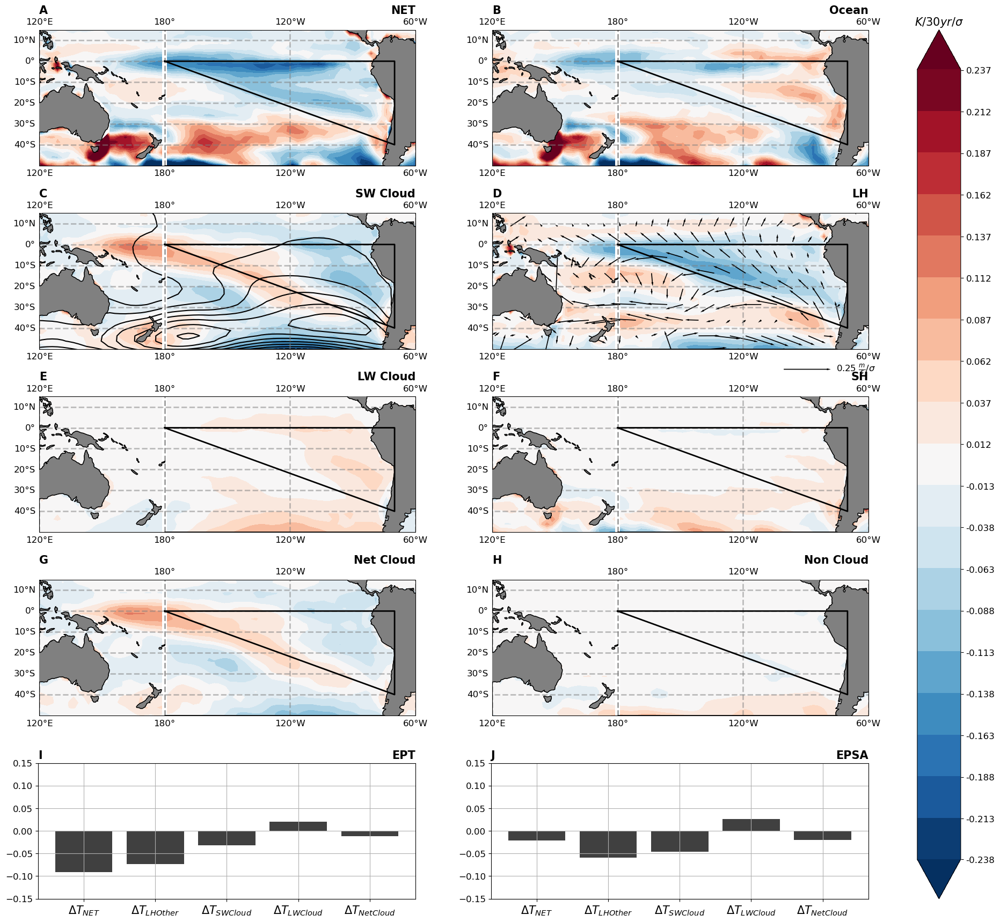

In [27]:
trend_min, trend_max, trend_step = -0.0125-0.025*9, 0.0125+0.025*10, 0.025
levels = np.arange(trend_min, trend_max, trend_step)

idx = ["NET_CM", "O", "LH_Other", "SH", "CLD_SW", "CLD_LW", "CLOUD_CM", "NON_CLOUD_CM"]
idx = ["NET_CM", "LH_Other", "CLD_SW", "CLD_LW", "CLOUD_CM"]
ticklabels = [
    r"$\Delta T_{NET}$",
    # r"$\Delta T_{O}$",
    r"$\Delta T_{LH Other}$", 
    # r"$\Delta T_{SH}$", 
    r"$\Delta T_{SW Cloud}$", 
    r"$\Delta T_{LW Cloud}$", 
    r"$\Delta T_{Net Cloud}$",
    # r"$\Delta T_{Non Cloud}$",
]

figure_3(
    seb_cmip6=SEB_CMIP_1sig,
    include_winds=True,
    include_psl=True,
    corr_cmip={ticklabels[i]: sig_SEB[key] for i, key in enumerate(idx)},
    p_cmip={ticklabels[i]: (1,1) for i, key in enumerate(idx)},
    levels=levels,
    save_name="/home/espinosa10/SO-EP-teleconnection/Figures/Figure_SX_SO_1sig_Reg",
    cur_fig="S3"
)

# Figure 1-Sigma Southern Ocean Cooling - Group by SWCF EPSA

In [ ]:
# # MASK COASTAL USURF and VSURF that are 4-sigma huge outliers
seb_dif["USURF"] = seb_dif["USURF"].where(np.fabs(seb_dif["USURF"]) <= seb_dif["USURF"].mean(["lat", "lon"]) + 4*seb_dif["USURF"].std(["lat", "lon"]))
seb_dif["VSURF"] = seb_dif["VSURF"].where(np.fabs(seb_dif["VSURF"]) <= seb_dif["VSURF"].mean(["lat", "lon"]) + 4*seb_dif["VSURF"].std(["lat", "lon"]))

In [ ]:
# # MASK COASTAL USURF and VSURF that are 4-sigma huge outliers
seb_dif_coupling["USURF"] = seb_dif_coupling["USURF"].where(np.fabs(seb_dif_coupling["USURF"]) <= seb_dif_coupling["USURF"].mean(["lat", "lon"]) + 4*seb_dif_coupling["USURF"].std(["lat", "lon"]))
seb_dif_coupling["VSURF"] = seb_dif_coupling["VSURF"].where(np.fabs(seb_dif_coupling["VSURF"]) <= seb_dif_coupling["VSURF"].mean(["lat", "lon"]) + 4*seb_dif_coupling["VSURF"].std(["lat", "lon"]))

seb_dif_coupling["USURF"] = seb_dif_coupling["USURF"].where(np.fabs(seb_dif_coupling["USURF"]) <= seb_dif_coupling["USURF"].mean(["lat", "lon"]) + 4*seb_dif_coupling["USURF"].std(["lat", "lon"]))
seb_dif_coupling["VSURF"] = seb_dif_coupling["VSURF"].where(np.fabs(seb_dif_coupling["VSURF"]) <= seb_dif_coupling["VSURF"].mean(["lat", "lon"]) + 4*seb_dif_coupling["VSURF"].std(["lat", "lon"]))

In [ ]:
# # MASK COASTAL USURF and VSURF that are 4-sigma huge outliers
seb_dif_precip["USURF"] = seb_dif_precip["USURF"].where(np.fabs(seb_dif_precip["USURF"]) <= seb_dif_precip["USURF"].mean(["lat", "lon"]) + 4*seb_dif_precip["USURF"].std(["lat", "lon"]))
seb_dif_precip["VSURF"] = seb_dif_precip["VSURF"].where(np.fabs(seb_dif_precip["VSURF"]) <= seb_dif_precip["VSURF"].mean(["lat", "lon"]) + 4*seb_dif_precip["VSURF"].std(["lat", "lon"]))

seb_dif_precip["USURF"] = seb_dif_precip["USURF"].where(np.fabs(seb_dif_precip["USURF"]) <= seb_dif_precip["USURF"].mean(["lat", "lon"]) + 4*seb_dif_precip["USURF"].std(["lat", "lon"]))
seb_dif_precip["VSURF"] = seb_dif_precip["VSURF"].where(np.fabs(seb_dif_precip["VSURF"]) <= seb_dif_precip["VSURF"].mean(["lat", "lon"]) + 4*seb_dif_precip["VSURF"].std(["lat", "lon"]))

[-75. -70. -65. -60. -55. -50. -45. -40. -35. -30. -25. -20. -15. -10.
  -5.   0.   5.  10.  15.  20.  25.  30.  35.  40.  45.  50.  55.  60.
  65.  70.  75.]


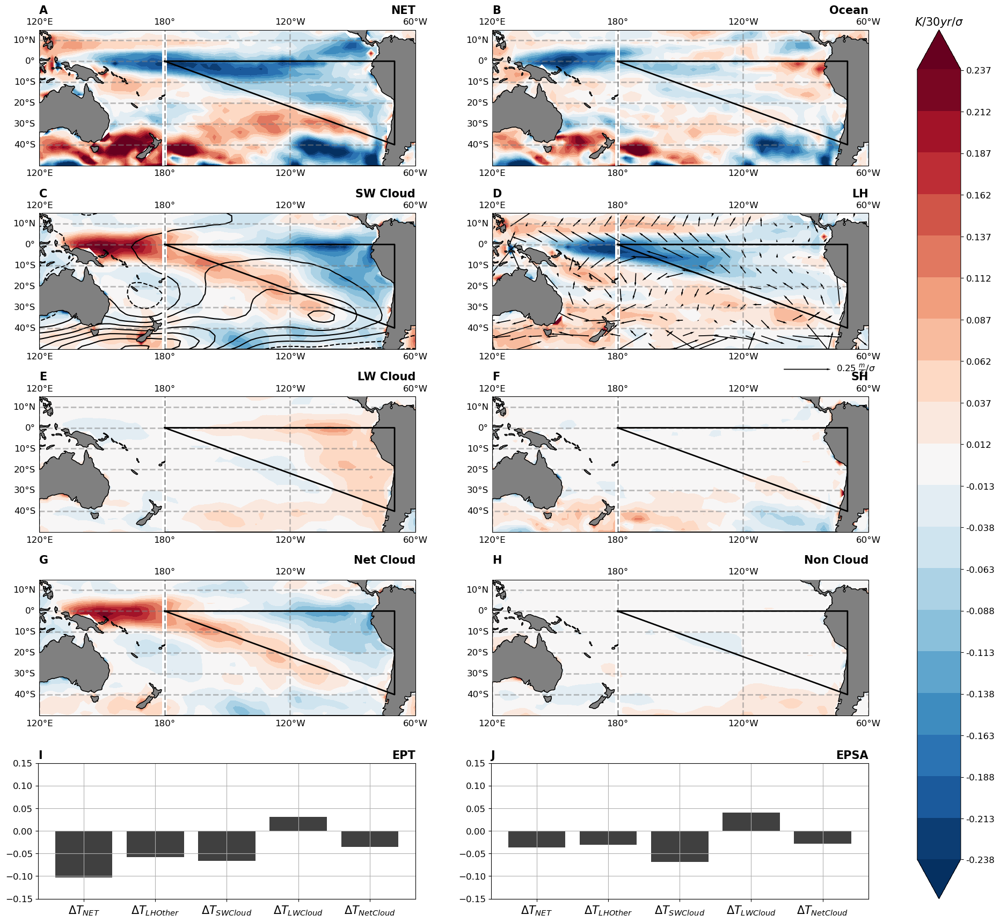

In [31]:
trend_min, trend_max, trend_step = -0.0125-0.025*9, 0.0125+0.025*10, 0.025
levels = np.arange(trend_min, trend_max, trend_step)

idx = ["NET_CM", "O", "LH_Other", "SH", "CLD_SW", "CLD_LW", "CLOUD_CM", "NON_CLOUD_CM"]
idx = ["NET_CM", "LH_Other", "CLD_SW", "CLD_LW", "CLOUD_CM"]
ticklabels = [
    r"$\Delta T_{NET}$",
    # r"$\Delta T_{O}$",
    r"$\Delta T_{LH Other}$", 
    # r"$\Delta T_{SH}$", 
    r"$\Delta T_{SW Cloud}$", 
    r"$\Delta T_{LW Cloud}$", 
    r"$\Delta T_{Net Cloud}$",
    # r"$\Delta T_{Non Cloud}$",
]

figure_3(
    seb_cmip6=seb_dif,
    include_winds=True,
    include_psl=True,
    corr_cmip={ticklabels[i]: sig_SEB_swcf[key] for i, key in enumerate(idx)},
    p_cmip={ticklabels[i]: (1,1) for i, key in enumerate(idx)},
    levels=levels,
    save_name="/home/espinosa10/SO-EP-teleconnection/Figures/Figure_SX_SO_1sig_Reg_grouped_swcf",
)

# Figure 1-Sigma Southern Ocean Cooling - Grouped by Coupling Coefficient

[-75. -70. -65. -60. -55. -50. -45. -40. -35. -30. -25. -20. -15. -10.
  -5.   0.   5.  10.  15.  20.  25.  30.  35.  40.  45.  50.  55.  60.
  65.  70.  75.]


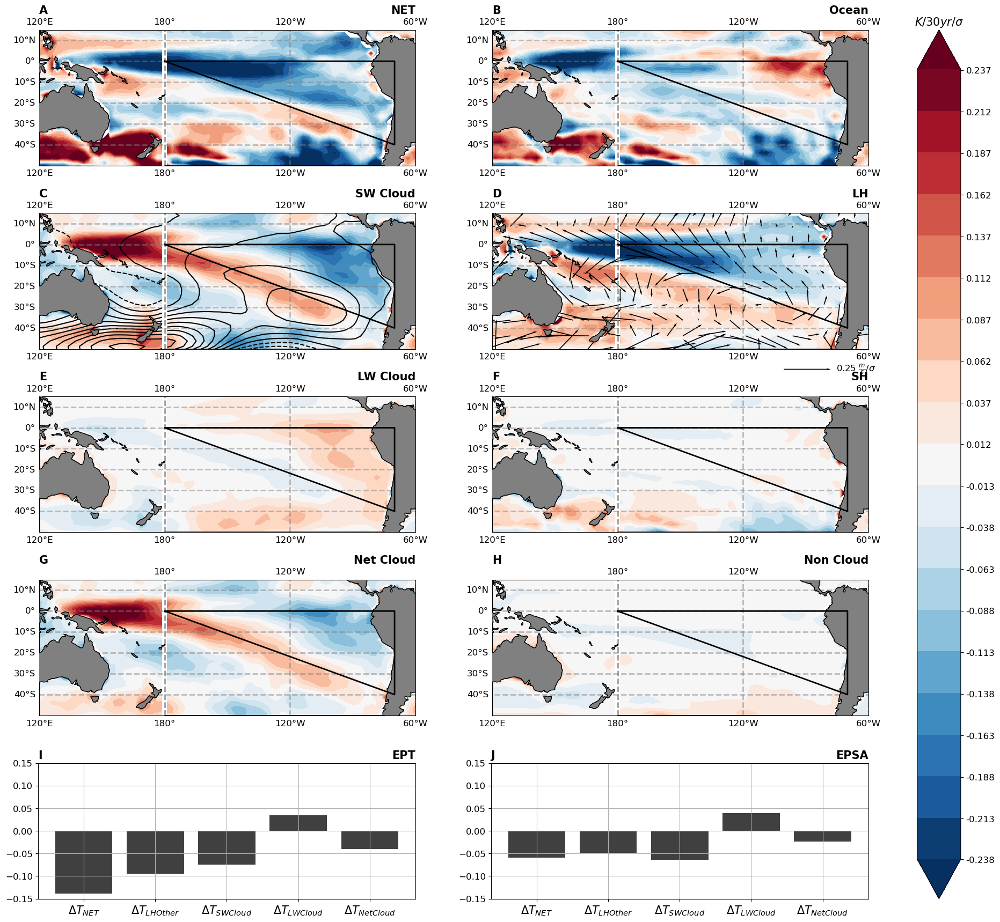

In [43]:
trend_min, trend_max, trend_step = -0.0125-0.025*9, 0.0125+0.025*10, 0.025
levels = np.arange(trend_min, trend_max, trend_step)

idx = ["NET_CM", "O", "LH_Other", "SH", "CLD_SW", "CLD_LW", "CLOUD_CM", "NON_CLOUD_CM"]
idx = ["NET_CM", "LH_Other", "CLD_SW", "CLD_LW", "CLOUD_CM"]
ticklabels = [
    r"$\Delta T_{NET}$",
    # r"$\Delta T_{O}$",
    r"$\Delta T_{LH Other}$", 
    # r"$\Delta T_{SH}$", 
    r"$\Delta T_{SW Cloud}$", 
    r"$\Delta T_{LW Cloud}$", 
    r"$\Delta T_{Net Cloud}$",
    # r"$\Delta T_{Non Cloud}$",
]

figure_3(
    seb_cmip6=seb_dif_coupling,
    include_winds=True,
    include_psl=True,
    corr_cmip={ticklabels[i]: sig_SEB_coupling[key] for i, key in enumerate(idx)},
    p_cmip={ticklabels[i]: (1,1) for i, key in enumerate(idx)},
    levels=levels,
    save_name="/home/espinosa10/SO-EP-teleconnection/Figures/Figure_SX_SO_1sig_Reg_grouped_coupling_coeff",
)

# Figure 1-Sigma Southern Ocean Cooling - Grouped by Double ITCZ Bias

[-75. -70. -65. -60. -55. -50. -45. -40. -35. -30. -25. -20. -15. -10.
  -5.   0.   5.  10.  15.  20.  25.  30.  35.  40.  45.  50.  55.  60.
  65.  70.  75.]


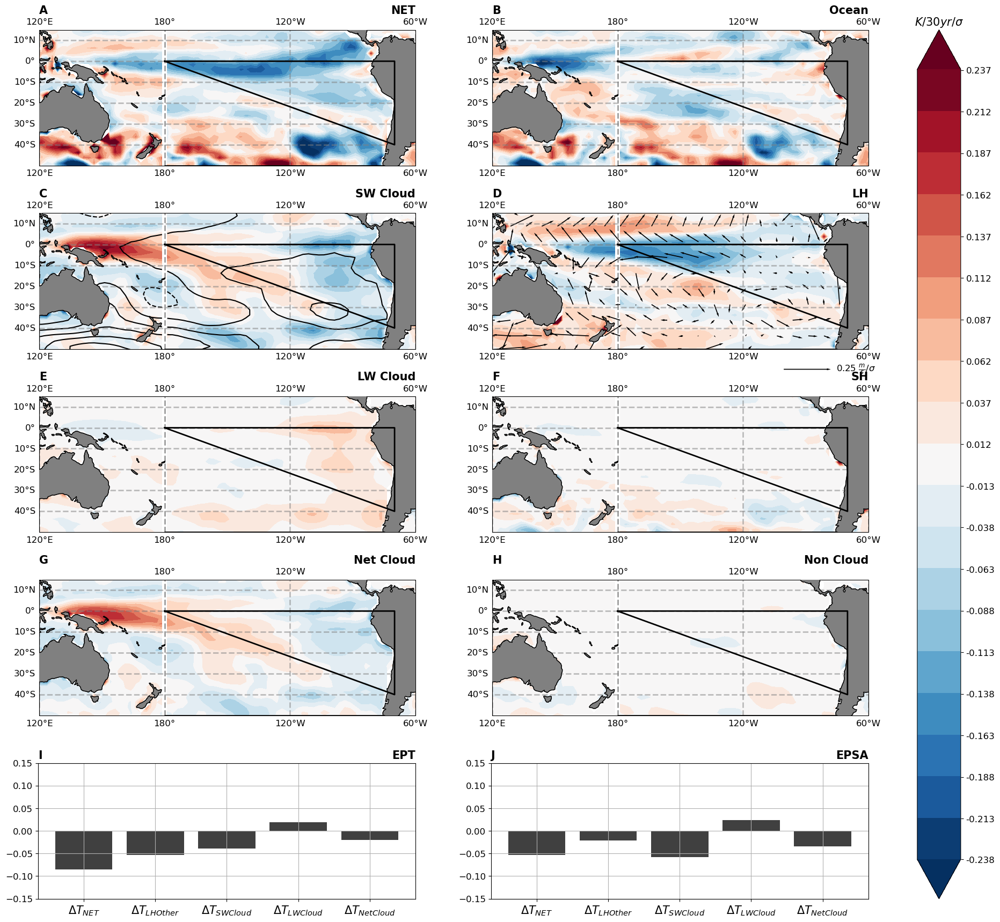

In [44]:
trend_min, trend_max, trend_step = -0.0125-0.025*9, 0.0125+0.025*10, 0.025
levels = np.arange(trend_min, trend_max, trend_step)

# idx = ["NET_CM", "O", "LH_Other", "SH", "CLD_SW", "CLD_LW", "CLOUD_CM", "NON_CLOUD_CM"]
idx = ["NET_CM", "LH_Other", "CLD_SW", "CLD_LW", "CLOUD_CM"]
ticklabels = [
    r"$\Delta T_{NET}$",
    # r"$\Delta T_{O}$",
    r"$\Delta T_{LH Other}$", 
    # r"$\Delta T_{SH}$", 
    r"$\Delta T_{SW Cloud}$", 
    r"$\Delta T_{LW Cloud}$", 
    r"$\Delta T_{Net Cloud}$",
    # r"$\Delta T_{Non Cloud}$",
]

figure_3(
    seb_cmip6=-seb_dif_precip,
    include_winds=True,
    include_psl=True,
    corr_cmip={ticklabels[i]: sig_SEB_precip[key] for i, key in enumerate(idx)},
    p_cmip={ticklabels[i]: (1,1) for i, key in enumerate(idx)},
    levels=levels,
    save_name="/home/espinosa10/SO-EP-teleconnection/Figures/Figure_SX_SO_1sig_Reg_grouped_precip_clim",
)

# Figure SX: Fig 3 Each Model (Supplement)

In [51]:
sorted_models = SWCF_CMIP.sortby(SWCF_CMIP, ascending=False).model

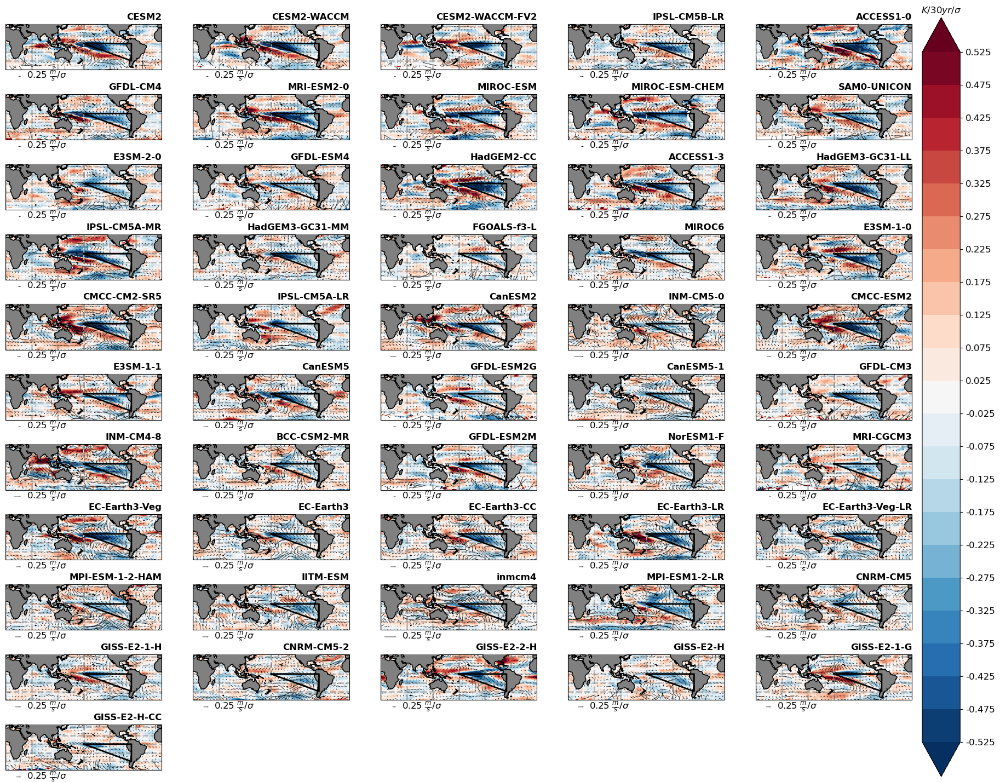

In [52]:
trend_min, trend_max, trend_step = -0.525, 0.575, 0.05
levels = np.arange(trend_min, trend_max, trend_step)
figure_SX(
    SEB_CMIP_1sig_model.sel(model=sorted_models),
    levels, 
    cvar="LH_Other",
    include_winds=True, 
    save_name="manuscript_figures/SI_Figures/Figures_SX_LH_models_contours_update.png")

/home/espinosa10/miniconda3/envs/swc/lib/python3.11/site-packages/xskillscore/core/np_deterministic.py:202: RuntimeWarning: invalid value encountered in divide
  res = s_num / s_den
/home/espinosa10/miniconda3/envs/swc/lib/python3.11/site-packages/xskillscore/core/np_deterministic.py:202: RuntimeWarning: invalid value encountered in divide
  res = s_num / s_den
/home/espinosa10/miniconda3/envs/swc/lib/python3.11/site-packages/xskillscore/core/np_deterministic.py:202: RuntimeWarning: invalid value encountered in divide
  res = s_num / s_den
/home/espinosa10/miniconda3/envs/swc/lib/python3.11/site-packages/xskillscore/core/np_deterministic.py:202: RuntimeWarning: invalid value encountered in divide
  res = s_num / s_den
/home/espinosa10/miniconda3/envs/swc/lib/python3.11/site-packages/xskillscore/core/np_deterministic.py:202: RuntimeWarning: invalid value encountered in divide
  res = s_num / s_den
/home/espinosa10/miniconda3/envs/swc/lib/python3.11/site-packages/xskillscore/core/np_dete

[-70. -50. -30. -10.  10.  30.  50.  70.]


/home/espinosa10/miniconda3/envs/swc/lib/python3.11/site-packages/xskillscore/core/np_deterministic.py:202: RuntimeWarning: invalid value encountered in divide
  res = s_num / s_den
/home/espinosa10/miniconda3/envs/swc/lib/python3.11/site-packages/xskillscore/core/np_deterministic.py:202: RuntimeWarning: invalid value encountered in divide
  res = s_num / s_den
/home/espinosa10/miniconda3/envs/swc/lib/python3.11/site-packages/xskillscore/core/np_deterministic.py:202: RuntimeWarning: invalid value encountered in divide
  res = s_num / s_den
/home/espinosa10/miniconda3/envs/swc/lib/python3.11/site-packages/xskillscore/core/np_deterministic.py:202: RuntimeWarning: invalid value encountered in divide
  res = s_num / s_den
/home/espinosa10/miniconda3/envs/swc/lib/python3.11/site-packages/xskillscore/core/np_deterministic.py:202: RuntimeWarning: invalid value encountered in divide
  res = s_num / s_den
/home/espinosa10/miniconda3/envs/swc/lib/python3.11/site-packages/xskillscore/core/np_dete

[-70. -50. -30. -10.  10.  30.  50.  70.]


/home/espinosa10/miniconda3/envs/swc/lib/python3.11/site-packages/xskillscore/core/np_deterministic.py:202: RuntimeWarning: invalid value encountered in divide
  res = s_num / s_den
/home/espinosa10/miniconda3/envs/swc/lib/python3.11/site-packages/xskillscore/core/np_deterministic.py:202: RuntimeWarning: invalid value encountered in divide
  res = s_num / s_den
/home/espinosa10/miniconda3/envs/swc/lib/python3.11/site-packages/xskillscore/core/np_deterministic.py:202: RuntimeWarning: invalid value encountered in divide
  res = s_num / s_den
/home/espinosa10/miniconda3/envs/swc/lib/python3.11/site-packages/xskillscore/core/np_deterministic.py:202: RuntimeWarning: invalid value encountered in divide
  res = s_num / s_den
/home/espinosa10/miniconda3/envs/swc/lib/python3.11/site-packages/xskillscore/core/np_deterministic.py:202: RuntimeWarning: invalid value encountered in divide
  res = s_num / s_den
/home/espinosa10/miniconda3/envs/swc/lib/python3.11/site-packages/xskillscore/core/np_dete

[-70. -50. -30. -10.  10.  30.  50.  70.]


/home/espinosa10/miniconda3/envs/swc/lib/python3.11/site-packages/xskillscore/core/np_deterministic.py:202: RuntimeWarning: invalid value encountered in divide
  res = s_num / s_den
/home/espinosa10/miniconda3/envs/swc/lib/python3.11/site-packages/xskillscore/core/np_deterministic.py:202: RuntimeWarning: invalid value encountered in divide
  res = s_num / s_den
/home/espinosa10/miniconda3/envs/swc/lib/python3.11/site-packages/xskillscore/core/np_deterministic.py:202: RuntimeWarning: invalid value encountered in divide
  res = s_num / s_den
/home/espinosa10/miniconda3/envs/swc/lib/python3.11/site-packages/xskillscore/core/np_deterministic.py:202: RuntimeWarning: invalid value encountered in divide
  res = s_num / s_den
/home/espinosa10/miniconda3/envs/swc/lib/python3.11/site-packages/xskillscore/core/np_deterministic.py:202: RuntimeWarning: invalid value encountered in divide
  res = s_num / s_den
/home/espinosa10/miniconda3/envs/swc/lib/python3.11/site-packages/xskillscore/core/np_dete

[-70. -50. -30. -10.  10.  30.  50.  70.]


/home/espinosa10/miniconda3/envs/swc/lib/python3.11/site-packages/xskillscore/core/np_deterministic.py:202: RuntimeWarning: invalid value encountered in divide
  res = s_num / s_den
/home/espinosa10/miniconda3/envs/swc/lib/python3.11/site-packages/xskillscore/core/np_deterministic.py:202: RuntimeWarning: invalid value encountered in divide
  res = s_num / s_den
/home/espinosa10/miniconda3/envs/swc/lib/python3.11/site-packages/xskillscore/core/np_deterministic.py:202: RuntimeWarning: invalid value encountered in divide
  res = s_num / s_den
/home/espinosa10/miniconda3/envs/swc/lib/python3.11/site-packages/xskillscore/core/np_deterministic.py:202: RuntimeWarning: invalid value encountered in divide
  res = s_num / s_den
/home/espinosa10/miniconda3/envs/swc/lib/python3.11/site-packages/xskillscore/core/np_deterministic.py:202: RuntimeWarning: invalid value encountered in divide
  res = s_num / s_den
/home/espinosa10/miniconda3/envs/swc/lib/python3.11/site-packages/xskillscore/core/np_dete

[-70. -50. -30. -10.  10.  30.  50.  70.]


/home/espinosa10/miniconda3/envs/swc/lib/python3.11/site-packages/xskillscore/core/np_deterministic.py:202: RuntimeWarning: invalid value encountered in divide
  res = s_num / s_den
/home/espinosa10/miniconda3/envs/swc/lib/python3.11/site-packages/xskillscore/core/np_deterministic.py:202: RuntimeWarning: invalid value encountered in divide
  res = s_num / s_den
/home/espinosa10/miniconda3/envs/swc/lib/python3.11/site-packages/xskillscore/core/np_deterministic.py:202: RuntimeWarning: invalid value encountered in divide
  res = s_num / s_den
/home/espinosa10/miniconda3/envs/swc/lib/python3.11/site-packages/xskillscore/core/np_deterministic.py:202: RuntimeWarning: invalid value encountered in divide
  res = s_num / s_den
/home/espinosa10/miniconda3/envs/swc/lib/python3.11/site-packages/xskillscore/core/np_deterministic.py:202: RuntimeWarning: invalid value encountered in divide
  res = s_num / s_den
/home/espinosa10/miniconda3/envs/swc/lib/python3.11/site-packages/xskillscore/core/np_dete

[-70. -50. -30. -10.  10.  30.  50.  70.]


/home/espinosa10/miniconda3/envs/swc/lib/python3.11/site-packages/xskillscore/core/np_deterministic.py:202: RuntimeWarning: invalid value encountered in divide
  res = s_num / s_den
/home/espinosa10/miniconda3/envs/swc/lib/python3.11/site-packages/xskillscore/core/np_deterministic.py:202: RuntimeWarning: invalid value encountered in divide
  res = s_num / s_den
/home/espinosa10/miniconda3/envs/swc/lib/python3.11/site-packages/xskillscore/core/np_deterministic.py:202: RuntimeWarning: invalid value encountered in divide
  res = s_num / s_den
/home/espinosa10/miniconda3/envs/swc/lib/python3.11/site-packages/xskillscore/core/np_deterministic.py:202: RuntimeWarning: invalid value encountered in divide
  res = s_num / s_den
/home/espinosa10/miniconda3/envs/swc/lib/python3.11/site-packages/xskillscore/core/np_deterministic.py:202: RuntimeWarning: invalid value encountered in divide
  res = s_num / s_den
/home/espinosa10/miniconda3/envs/swc/lib/python3.11/site-packages/xskillscore/core/np_dete

[-70. -50. -30. -10.  10.  30.  50.  70.]
[-70. -50. -30. -10.  10.  30.  50.  70.]


/home/espinosa10/miniconda3/envs/swc/lib/python3.11/site-packages/xskillscore/core/np_deterministic.py:202: RuntimeWarning: invalid value encountered in divide
  res = s_num / s_den
/home/espinosa10/miniconda3/envs/swc/lib/python3.11/site-packages/xskillscore/core/np_deterministic.py:202: RuntimeWarning: invalid value encountered in divide
  res = s_num / s_den
/home/espinosa10/miniconda3/envs/swc/lib/python3.11/site-packages/xskillscore/core/np_deterministic.py:202: RuntimeWarning: invalid value encountered in divide
  res = s_num / s_den
/home/espinosa10/miniconda3/envs/swc/lib/python3.11/site-packages/xskillscore/core/np_deterministic.py:202: RuntimeWarning: invalid value encountered in divide
  res = s_num / s_den
/home/espinosa10/miniconda3/envs/swc/lib/python3.11/site-packages/xskillscore/core/np_deterministic.py:202: RuntimeWarning: invalid value encountered in divide
  res = s_num / s_den
/home/espinosa10/miniconda3/envs/swc/lib/python3.11/site-packages/xskillscore/core/np_dete

[-70. -50. -30. -10.  10.  30.  50.  70.]


/home/espinosa10/miniconda3/envs/swc/lib/python3.11/site-packages/xskillscore/core/np_deterministic.py:202: RuntimeWarning: invalid value encountered in divide
  res = s_num / s_den
/home/espinosa10/miniconda3/envs/swc/lib/python3.11/site-packages/xskillscore/core/np_deterministic.py:202: RuntimeWarning: invalid value encountered in divide
  res = s_num / s_den
/home/espinosa10/miniconda3/envs/swc/lib/python3.11/site-packages/xskillscore/core/np_deterministic.py:202: RuntimeWarning: invalid value encountered in divide
  res = s_num / s_den
/home/espinosa10/miniconda3/envs/swc/lib/python3.11/site-packages/xskillscore/core/np_deterministic.py:202: RuntimeWarning: invalid value encountered in divide
  res = s_num / s_den
/home/espinosa10/miniconda3/envs/swc/lib/python3.11/site-packages/xskillscore/core/np_deterministic.py:202: RuntimeWarning: invalid value encountered in divide
  res = s_num / s_den
/home/espinosa10/miniconda3/envs/swc/lib/python3.11/site-packages/xskillscore/core/np_dete

[-70. -50. -30. -10.  10.  30.  50.  70.]


/home/espinosa10/miniconda3/envs/swc/lib/python3.11/site-packages/xskillscore/core/np_deterministic.py:202: RuntimeWarning: invalid value encountered in divide
  res = s_num / s_den
/home/espinosa10/miniconda3/envs/swc/lib/python3.11/site-packages/xskillscore/core/np_deterministic.py:202: RuntimeWarning: invalid value encountered in divide
  res = s_num / s_den
/home/espinosa10/miniconda3/envs/swc/lib/python3.11/site-packages/xskillscore/core/np_deterministic.py:202: RuntimeWarning: invalid value encountered in divide
  res = s_num / s_den
/home/espinosa10/miniconda3/envs/swc/lib/python3.11/site-packages/xskillscore/core/np_deterministic.py:202: RuntimeWarning: invalid value encountered in divide
  res = s_num / s_den
/home/espinosa10/miniconda3/envs/swc/lib/python3.11/site-packages/xskillscore/core/np_deterministic.py:202: RuntimeWarning: invalid value encountered in divide
  res = s_num / s_den
/home/espinosa10/miniconda3/envs/swc/lib/python3.11/site-packages/xskillscore/core/np_dete

[-70. -50. -30. -10.  10.  30.  50.  70.]


/home/espinosa10/miniconda3/envs/swc/lib/python3.11/site-packages/xskillscore/core/np_deterministic.py:202: RuntimeWarning: invalid value encountered in divide
  res = s_num / s_den
/home/espinosa10/miniconda3/envs/swc/lib/python3.11/site-packages/xskillscore/core/np_deterministic.py:202: RuntimeWarning: invalid value encountered in divide
  res = s_num / s_den
/home/espinosa10/miniconda3/envs/swc/lib/python3.11/site-packages/xskillscore/core/np_deterministic.py:202: RuntimeWarning: invalid value encountered in divide
  res = s_num / s_den
/home/espinosa10/miniconda3/envs/swc/lib/python3.11/site-packages/xskillscore/core/np_deterministic.py:202: RuntimeWarning: invalid value encountered in divide
  res = s_num / s_den
/home/espinosa10/miniconda3/envs/swc/lib/python3.11/site-packages/xskillscore/core/np_deterministic.py:202: RuntimeWarning: invalid value encountered in divide
  res = s_num / s_den
/home/espinosa10/miniconda3/envs/swc/lib/python3.11/site-packages/xskillscore/core/np_dete

[-70. -50. -30. -10.  10.  30.  50.  70.]


/home/espinosa10/miniconda3/envs/swc/lib/python3.11/site-packages/xskillscore/core/np_deterministic.py:202: RuntimeWarning: invalid value encountered in divide
  res = s_num / s_den
/home/espinosa10/miniconda3/envs/swc/lib/python3.11/site-packages/xskillscore/core/np_deterministic.py:202: RuntimeWarning: invalid value encountered in divide
  res = s_num / s_den
/home/espinosa10/miniconda3/envs/swc/lib/python3.11/site-packages/xskillscore/core/np_deterministic.py:202: RuntimeWarning: invalid value encountered in divide
  res = s_num / s_den
/home/espinosa10/miniconda3/envs/swc/lib/python3.11/site-packages/xskillscore/core/np_deterministic.py:202: RuntimeWarning: invalid value encountered in divide
  res = s_num / s_den
/home/espinosa10/miniconda3/envs/swc/lib/python3.11/site-packages/xskillscore/core/np_deterministic.py:202: RuntimeWarning: invalid value encountered in divide
  res = s_num / s_den
/home/espinosa10/miniconda3/envs/swc/lib/python3.11/site-packages/xskillscore/core/np_dete

[-70. -50. -30. -10.  10.  30.  50.  70.]


/home/espinosa10/miniconda3/envs/swc/lib/python3.11/site-packages/xskillscore/core/np_deterministic.py:202: RuntimeWarning: invalid value encountered in divide
  res = s_num / s_den
/home/espinosa10/miniconda3/envs/swc/lib/python3.11/site-packages/xskillscore/core/np_deterministic.py:202: RuntimeWarning: invalid value encountered in divide
  res = s_num / s_den
/home/espinosa10/miniconda3/envs/swc/lib/python3.11/site-packages/xskillscore/core/np_deterministic.py:202: RuntimeWarning: invalid value encountered in divide
  res = s_num / s_den
/home/espinosa10/miniconda3/envs/swc/lib/python3.11/site-packages/xskillscore/core/np_deterministic.py:202: RuntimeWarning: invalid value encountered in divide
  res = s_num / s_den
/home/espinosa10/miniconda3/envs/swc/lib/python3.11/site-packages/xskillscore/core/np_deterministic.py:202: RuntimeWarning: invalid value encountered in divide
  res = s_num / s_den


[-70. -50. -30. -10.  10.  30.  50.  70.]


/home/espinosa10/miniconda3/envs/swc/lib/python3.11/site-packages/xskillscore/core/np_deterministic.py:202: RuntimeWarning: invalid value encountered in divide
  res = s_num / s_den
/home/espinosa10/miniconda3/envs/swc/lib/python3.11/site-packages/xskillscore/core/np_deterministic.py:202: RuntimeWarning: invalid value encountered in divide
  res = s_num / s_den
/home/espinosa10/miniconda3/envs/swc/lib/python3.11/site-packages/xskillscore/core/np_deterministic.py:202: RuntimeWarning: invalid value encountered in divide
  res = s_num / s_den
/home/espinosa10/miniconda3/envs/swc/lib/python3.11/site-packages/xskillscore/core/np_deterministic.py:202: RuntimeWarning: invalid value encountered in divide
  res = s_num / s_den
/home/espinosa10/miniconda3/envs/swc/lib/python3.11/site-packages/xskillscore/core/np_deterministic.py:202: RuntimeWarning: invalid value encountered in divide
  res = s_num / s_den
/home/espinosa10/miniconda3/envs/swc/lib/python3.11/site-packages/xskillscore/core/np_dete

[-70. -50. -30. -10.  10.  30.  50.  70.]


/home/espinosa10/miniconda3/envs/swc/lib/python3.11/site-packages/xskillscore/core/np_deterministic.py:202: RuntimeWarning: invalid value encountered in divide
  res = s_num / s_den
/home/espinosa10/miniconda3/envs/swc/lib/python3.11/site-packages/xskillscore/core/np_deterministic.py:202: RuntimeWarning: invalid value encountered in divide
  res = s_num / s_den
/home/espinosa10/miniconda3/envs/swc/lib/python3.11/site-packages/xskillscore/core/np_deterministic.py:202: RuntimeWarning: invalid value encountered in divide
  res = s_num / s_den
/home/espinosa10/miniconda3/envs/swc/lib/python3.11/site-packages/xskillscore/core/np_deterministic.py:202: RuntimeWarning: invalid value encountered in divide
  res = s_num / s_den
/home/espinosa10/miniconda3/envs/swc/lib/python3.11/site-packages/xskillscore/core/np_deterministic.py:202: RuntimeWarning: invalid value encountered in divide
  res = s_num / s_den
/home/espinosa10/miniconda3/envs/swc/lib/python3.11/site-packages/xskillscore/core/np_dete

[-70. -50. -30. -10.  10.  30.  50.  70.]


/home/espinosa10/miniconda3/envs/swc/lib/python3.11/site-packages/xskillscore/core/np_deterministic.py:202: RuntimeWarning: invalid value encountered in divide
  res = s_num / s_den
/home/espinosa10/miniconda3/envs/swc/lib/python3.11/site-packages/xskillscore/core/np_deterministic.py:202: RuntimeWarning: invalid value encountered in divide
  res = s_num / s_den
/home/espinosa10/miniconda3/envs/swc/lib/python3.11/site-packages/xskillscore/core/np_deterministic.py:202: RuntimeWarning: invalid value encountered in divide
  res = s_num / s_den
/home/espinosa10/miniconda3/envs/swc/lib/python3.11/site-packages/xskillscore/core/np_deterministic.py:202: RuntimeWarning: invalid value encountered in divide
  res = s_num / s_den
/home/espinosa10/miniconda3/envs/swc/lib/python3.11/site-packages/xskillscore/core/np_deterministic.py:202: RuntimeWarning: invalid value encountered in divide
  res = s_num / s_den
/home/espinosa10/miniconda3/envs/swc/lib/python3.11/site-packages/xskillscore/core/np_dete

[-70. -50. -30. -10.  10.  30.  50.  70.]


/home/espinosa10/miniconda3/envs/swc/lib/python3.11/site-packages/xskillscore/core/np_deterministic.py:202: RuntimeWarning: invalid value encountered in divide
  res = s_num / s_den
/home/espinosa10/miniconda3/envs/swc/lib/python3.11/site-packages/xskillscore/core/np_deterministic.py:202: RuntimeWarning: invalid value encountered in divide
  res = s_num / s_den
/home/espinosa10/miniconda3/envs/swc/lib/python3.11/site-packages/xskillscore/core/np_deterministic.py:202: RuntimeWarning: invalid value encountered in divide
  res = s_num / s_den
/home/espinosa10/miniconda3/envs/swc/lib/python3.11/site-packages/xskillscore/core/np_deterministic.py:202: RuntimeWarning: invalid value encountered in divide
  res = s_num / s_den
/home/espinosa10/miniconda3/envs/swc/lib/python3.11/site-packages/xskillscore/core/np_deterministic.py:202: RuntimeWarning: invalid value encountered in divide
  res = s_num / s_den
/home/espinosa10/miniconda3/envs/swc/lib/python3.11/site-packages/xskillscore/core/np_dete

[-70. -50. -30. -10.  10.  30.  50.  70.]
[-70. -50. -30. -10.  10.  30.  50.  70.]


/home/espinosa10/miniconda3/envs/swc/lib/python3.11/site-packages/xskillscore/core/np_deterministic.py:202: RuntimeWarning: invalid value encountered in divide
  res = s_num / s_den
/home/espinosa10/miniconda3/envs/swc/lib/python3.11/site-packages/xskillscore/core/np_deterministic.py:202: RuntimeWarning: invalid value encountered in divide
  res = s_num / s_den
/home/espinosa10/miniconda3/envs/swc/lib/python3.11/site-packages/xskillscore/core/np_deterministic.py:202: RuntimeWarning: invalid value encountered in divide
  res = s_num / s_den
/home/espinosa10/miniconda3/envs/swc/lib/python3.11/site-packages/xskillscore/core/np_deterministic.py:202: RuntimeWarning: invalid value encountered in divide
  res = s_num / s_den
/home/espinosa10/miniconda3/envs/swc/lib/python3.11/site-packages/xskillscore/core/np_deterministic.py:202: RuntimeWarning: invalid value encountered in divide
  res = s_num / s_den
/home/espinosa10/miniconda3/envs/swc/lib/python3.11/site-packages/xskillscore/core/np_dete

[-70. -50. -30. -10.  10.  30.  50.  70.]


/home/espinosa10/miniconda3/envs/swc/lib/python3.11/site-packages/xskillscore/core/np_deterministic.py:202: RuntimeWarning: invalid value encountered in divide
  res = s_num / s_den
/home/espinosa10/miniconda3/envs/swc/lib/python3.11/site-packages/xskillscore/core/np_deterministic.py:202: RuntimeWarning: invalid value encountered in divide
  res = s_num / s_den
/home/espinosa10/miniconda3/envs/swc/lib/python3.11/site-packages/xskillscore/core/np_deterministic.py:202: RuntimeWarning: invalid value encountered in divide
  res = s_num / s_den
/home/espinosa10/miniconda3/envs/swc/lib/python3.11/site-packages/xskillscore/core/np_deterministic.py:202: RuntimeWarning: invalid value encountered in divide
  res = s_num / s_den
/home/espinosa10/miniconda3/envs/swc/lib/python3.11/site-packages/xskillscore/core/np_deterministic.py:202: RuntimeWarning: invalid value encountered in divide
  res = s_num / s_den


[-70. -50. -30. -10.  10.  30.  50.  70.]
[-70. -50. -30. -10.  10.  30.  50.  70.]


/home/espinosa10/miniconda3/envs/swc/lib/python3.11/site-packages/xskillscore/core/np_deterministic.py:202: RuntimeWarning: invalid value encountered in divide
  res = s_num / s_den
/home/espinosa10/miniconda3/envs/swc/lib/python3.11/site-packages/xskillscore/core/np_deterministic.py:202: RuntimeWarning: invalid value encountered in divide
  res = s_num / s_den
/home/espinosa10/miniconda3/envs/swc/lib/python3.11/site-packages/xskillscore/core/np_deterministic.py:202: RuntimeWarning: invalid value encountered in divide
  res = s_num / s_den
/home/espinosa10/miniconda3/envs/swc/lib/python3.11/site-packages/xskillscore/core/np_deterministic.py:202: RuntimeWarning: invalid value encountered in divide
  res = s_num / s_den
/home/espinosa10/miniconda3/envs/swc/lib/python3.11/site-packages/xskillscore/core/np_deterministic.py:202: RuntimeWarning: invalid value encountered in divide
  res = s_num / s_den
/home/espinosa10/miniconda3/envs/swc/lib/python3.11/site-packages/xskillscore/core/np_dete

[-70. -50. -30. -10.  10.  30.  50.  70.]


/home/espinosa10/miniconda3/envs/swc/lib/python3.11/site-packages/xskillscore/core/np_deterministic.py:202: RuntimeWarning: invalid value encountered in divide
  res = s_num / s_den
/home/espinosa10/miniconda3/envs/swc/lib/python3.11/site-packages/xskillscore/core/np_deterministic.py:202: RuntimeWarning: invalid value encountered in divide
  res = s_num / s_den
/home/espinosa10/miniconda3/envs/swc/lib/python3.11/site-packages/xskillscore/core/np_deterministic.py:202: RuntimeWarning: invalid value encountered in divide
  res = s_num / s_den
/home/espinosa10/miniconda3/envs/swc/lib/python3.11/site-packages/xskillscore/core/np_deterministic.py:202: RuntimeWarning: invalid value encountered in divide
  res = s_num / s_den
/home/espinosa10/miniconda3/envs/swc/lib/python3.11/site-packages/xskillscore/core/np_deterministic.py:202: RuntimeWarning: invalid value encountered in divide
  res = s_num / s_den
/home/espinosa10/miniconda3/envs/swc/lib/python3.11/site-packages/xskillscore/core/np_dete

[-70. -50. -30. -10.  10.  30.  50.  70.]


/home/espinosa10/miniconda3/envs/swc/lib/python3.11/site-packages/xskillscore/core/np_deterministic.py:202: RuntimeWarning: invalid value encountered in divide
  res = s_num / s_den
/home/espinosa10/miniconda3/envs/swc/lib/python3.11/site-packages/xskillscore/core/np_deterministic.py:202: RuntimeWarning: invalid value encountered in divide
  res = s_num / s_den


[-70. -50. -30. -10.  10.  30.  50.  70.]


/home/espinosa10/miniconda3/envs/swc/lib/python3.11/site-packages/xskillscore/core/np_deterministic.py:202: RuntimeWarning: invalid value encountered in divide
  res = s_num / s_den
/home/espinosa10/miniconda3/envs/swc/lib/python3.11/site-packages/xskillscore/core/np_deterministic.py:202: RuntimeWarning: invalid value encountered in divide
  res = s_num / s_den
/home/espinosa10/miniconda3/envs/swc/lib/python3.11/site-packages/xskillscore/core/np_deterministic.py:202: RuntimeWarning: invalid value encountered in divide
  res = s_num / s_den
/home/espinosa10/miniconda3/envs/swc/lib/python3.11/site-packages/xskillscore/core/np_deterministic.py:202: RuntimeWarning: invalid value encountered in divide
  res = s_num / s_den
/home/espinosa10/miniconda3/envs/swc/lib/python3.11/site-packages/xskillscore/core/np_deterministic.py:202: RuntimeWarning: invalid value encountered in divide
  res = s_num / s_den
/home/espinosa10/miniconda3/envs/swc/lib/python3.11/site-packages/xskillscore/core/np_dete

[-70. -50. -30. -10.  10.  30.  50.  70.]


/home/espinosa10/miniconda3/envs/swc/lib/python3.11/site-packages/xskillscore/core/np_deterministic.py:202: RuntimeWarning: invalid value encountered in divide
  res = s_num / s_den
/home/espinosa10/miniconda3/envs/swc/lib/python3.11/site-packages/xskillscore/core/np_deterministic.py:202: RuntimeWarning: invalid value encountered in divide
  res = s_num / s_den
/home/espinosa10/miniconda3/envs/swc/lib/python3.11/site-packages/xskillscore/core/np_deterministic.py:202: RuntimeWarning: invalid value encountered in divide
  res = s_num / s_den
/home/espinosa10/miniconda3/envs/swc/lib/python3.11/site-packages/xskillscore/core/np_deterministic.py:202: RuntimeWarning: invalid value encountered in divide
  res = s_num / s_den
/home/espinosa10/miniconda3/envs/swc/lib/python3.11/site-packages/xskillscore/core/np_deterministic.py:202: RuntimeWarning: invalid value encountered in divide
  res = s_num / s_den
/home/espinosa10/miniconda3/envs/swc/lib/python3.11/site-packages/xskillscore/core/np_dete

[-70. -50. -30. -10.  10.  30.  50.  70.]


/home/espinosa10/miniconda3/envs/swc/lib/python3.11/site-packages/xskillscore/core/np_deterministic.py:202: RuntimeWarning: invalid value encountered in divide
  res = s_num / s_den
/home/espinosa10/miniconda3/envs/swc/lib/python3.11/site-packages/xskillscore/core/np_deterministic.py:202: RuntimeWarning: invalid value encountered in divide
  res = s_num / s_den
/home/espinosa10/miniconda3/envs/swc/lib/python3.11/site-packages/xskillscore/core/np_deterministic.py:202: RuntimeWarning: invalid value encountered in divide
  res = s_num / s_den
/home/espinosa10/miniconda3/envs/swc/lib/python3.11/site-packages/xskillscore/core/np_deterministic.py:202: RuntimeWarning: invalid value encountered in divide
  res = s_num / s_den
/home/espinosa10/miniconda3/envs/swc/lib/python3.11/site-packages/xskillscore/core/np_deterministic.py:202: RuntimeWarning: invalid value encountered in divide
  res = s_num / s_den
/home/espinosa10/miniconda3/envs/swc/lib/python3.11/site-packages/xskillscore/core/np_dete

[-70. -50. -30. -10.  10.  30.  50.  70.]
[-70. -50. -30. -10.  10.  30.  50.  70.]


/home/espinosa10/miniconda3/envs/swc/lib/python3.11/site-packages/xskillscore/core/np_deterministic.py:202: RuntimeWarning: invalid value encountered in divide
  res = s_num / s_den
/home/espinosa10/miniconda3/envs/swc/lib/python3.11/site-packages/xskillscore/core/np_deterministic.py:202: RuntimeWarning: invalid value encountered in divide
  res = s_num / s_den
/home/espinosa10/miniconda3/envs/swc/lib/python3.11/site-packages/xskillscore/core/np_deterministic.py:202: RuntimeWarning: invalid value encountered in divide
  res = s_num / s_den
/home/espinosa10/miniconda3/envs/swc/lib/python3.11/site-packages/xskillscore/core/np_deterministic.py:202: RuntimeWarning: invalid value encountered in divide
  res = s_num / s_den
/home/espinosa10/miniconda3/envs/swc/lib/python3.11/site-packages/xskillscore/core/np_deterministic.py:202: RuntimeWarning: invalid value encountered in divide
  res = s_num / s_den
/home/espinosa10/miniconda3/envs/swc/lib/python3.11/site-packages/xskillscore/core/np_dete

[-70. -50. -30. -10.  10.  30.  50.  70.]


/home/espinosa10/miniconda3/envs/swc/lib/python3.11/site-packages/xskillscore/core/np_deterministic.py:202: RuntimeWarning: invalid value encountered in divide
  res = s_num / s_den
/home/espinosa10/miniconda3/envs/swc/lib/python3.11/site-packages/xskillscore/core/np_deterministic.py:202: RuntimeWarning: invalid value encountered in divide
  res = s_num / s_den
/home/espinosa10/miniconda3/envs/swc/lib/python3.11/site-packages/xskillscore/core/np_deterministic.py:202: RuntimeWarning: invalid value encountered in divide
  res = s_num / s_den
/home/espinosa10/miniconda3/envs/swc/lib/python3.11/site-packages/xskillscore/core/np_deterministic.py:202: RuntimeWarning: invalid value encountered in divide
  res = s_num / s_den
/home/espinosa10/miniconda3/envs/swc/lib/python3.11/site-packages/xskillscore/core/np_deterministic.py:202: RuntimeWarning: invalid value encountered in divide
  res = s_num / s_den
/home/espinosa10/miniconda3/envs/swc/lib/python3.11/site-packages/xskillscore/core/np_dete

[-70. -50. -30. -10.  10.  30.  50.  70.]


/home/espinosa10/miniconda3/envs/swc/lib/python3.11/site-packages/xskillscore/core/np_deterministic.py:202: RuntimeWarning: invalid value encountered in divide
  res = s_num / s_den
/home/espinosa10/miniconda3/envs/swc/lib/python3.11/site-packages/xskillscore/core/np_deterministic.py:202: RuntimeWarning: invalid value encountered in divide
  res = s_num / s_den
/home/espinosa10/miniconda3/envs/swc/lib/python3.11/site-packages/xskillscore/core/np_deterministic.py:202: RuntimeWarning: invalid value encountered in divide
  res = s_num / s_den
/home/espinosa10/miniconda3/envs/swc/lib/python3.11/site-packages/xskillscore/core/np_deterministic.py:202: RuntimeWarning: invalid value encountered in divide
  res = s_num / s_den
/home/espinosa10/miniconda3/envs/swc/lib/python3.11/site-packages/xskillscore/core/np_deterministic.py:202: RuntimeWarning: invalid value encountered in divide
  res = s_num / s_den
/home/espinosa10/miniconda3/envs/swc/lib/python3.11/site-packages/xskillscore/core/np_dete

[-70. -50. -30. -10.  10.  30.  50.  70.]


/home/espinosa10/miniconda3/envs/swc/lib/python3.11/site-packages/xskillscore/core/np_deterministic.py:202: RuntimeWarning: invalid value encountered in divide
  res = s_num / s_den
/home/espinosa10/miniconda3/envs/swc/lib/python3.11/site-packages/xskillscore/core/np_deterministic.py:202: RuntimeWarning: invalid value encountered in divide
  res = s_num / s_den
/home/espinosa10/miniconda3/envs/swc/lib/python3.11/site-packages/xskillscore/core/np_deterministic.py:202: RuntimeWarning: invalid value encountered in divide
  res = s_num / s_den
/home/espinosa10/miniconda3/envs/swc/lib/python3.11/site-packages/xskillscore/core/np_deterministic.py:202: RuntimeWarning: invalid value encountered in divide
  res = s_num / s_den
/home/espinosa10/miniconda3/envs/swc/lib/python3.11/site-packages/xskillscore/core/np_deterministic.py:202: RuntimeWarning: invalid value encountered in divide
  res = s_num / s_den
/home/espinosa10/miniconda3/envs/swc/lib/python3.11/site-packages/xskillscore/core/np_dete

[-70. -50. -30. -10.  10.  30.  50.  70.]


/home/espinosa10/miniconda3/envs/swc/lib/python3.11/site-packages/xskillscore/core/np_deterministic.py:202: RuntimeWarning: invalid value encountered in divide
  res = s_num / s_den
/home/espinosa10/miniconda3/envs/swc/lib/python3.11/site-packages/xskillscore/core/np_deterministic.py:202: RuntimeWarning: invalid value encountered in divide
  res = s_num / s_den
/home/espinosa10/miniconda3/envs/swc/lib/python3.11/site-packages/xskillscore/core/np_deterministic.py:202: RuntimeWarning: invalid value encountered in divide
  res = s_num / s_den
/home/espinosa10/miniconda3/envs/swc/lib/python3.11/site-packages/xskillscore/core/np_deterministic.py:202: RuntimeWarning: invalid value encountered in divide
  res = s_num / s_den
/home/espinosa10/miniconda3/envs/swc/lib/python3.11/site-packages/xskillscore/core/np_deterministic.py:202: RuntimeWarning: invalid value encountered in divide
  res = s_num / s_den
/home/espinosa10/miniconda3/envs/swc/lib/python3.11/site-packages/xskillscore/core/np_dete

[-70. -50. -30. -10.  10.  30.  50.  70.]


/home/espinosa10/miniconda3/envs/swc/lib/python3.11/site-packages/xskillscore/core/np_deterministic.py:202: RuntimeWarning: invalid value encountered in divide
  res = s_num / s_den
/home/espinosa10/miniconda3/envs/swc/lib/python3.11/site-packages/xskillscore/core/np_deterministic.py:202: RuntimeWarning: invalid value encountered in divide
  res = s_num / s_den
/home/espinosa10/miniconda3/envs/swc/lib/python3.11/site-packages/xskillscore/core/np_deterministic.py:202: RuntimeWarning: invalid value encountered in divide
  res = s_num / s_den
/home/espinosa10/miniconda3/envs/swc/lib/python3.11/site-packages/xskillscore/core/np_deterministic.py:202: RuntimeWarning: invalid value encountered in divide
  res = s_num / s_den
/home/espinosa10/miniconda3/envs/swc/lib/python3.11/site-packages/xskillscore/core/np_deterministic.py:202: RuntimeWarning: invalid value encountered in divide
  res = s_num / s_den


[-70. -50. -30. -10.  10.  30.  50.  70.]


/home/espinosa10/miniconda3/envs/swc/lib/python3.11/site-packages/xskillscore/core/np_deterministic.py:202: RuntimeWarning: invalid value encountered in divide
  res = s_num / s_den
/home/espinosa10/miniconda3/envs/swc/lib/python3.11/site-packages/xskillscore/core/np_deterministic.py:202: RuntimeWarning: invalid value encountered in divide
  res = s_num / s_den
/home/espinosa10/miniconda3/envs/swc/lib/python3.11/site-packages/xskillscore/core/np_deterministic.py:202: RuntimeWarning: invalid value encountered in divide
  res = s_num / s_den
/home/espinosa10/miniconda3/envs/swc/lib/python3.11/site-packages/xskillscore/core/np_deterministic.py:202: RuntimeWarning: invalid value encountered in divide
  res = s_num / s_den
/home/espinosa10/miniconda3/envs/swc/lib/python3.11/site-packages/xskillscore/core/np_deterministic.py:202: RuntimeWarning: invalid value encountered in divide
  res = s_num / s_den
/home/espinosa10/miniconda3/envs/swc/lib/python3.11/site-packages/xskillscore/core/np_dete

[-70. -50. -30. -10.  10.  30.  50.  70.]


/home/espinosa10/miniconda3/envs/swc/lib/python3.11/site-packages/xskillscore/core/np_deterministic.py:202: RuntimeWarning: invalid value encountered in divide
  res = s_num / s_den
/home/espinosa10/miniconda3/envs/swc/lib/python3.11/site-packages/xskillscore/core/np_deterministic.py:202: RuntimeWarning: invalid value encountered in divide
  res = s_num / s_den
/home/espinosa10/miniconda3/envs/swc/lib/python3.11/site-packages/xskillscore/core/np_deterministic.py:202: RuntimeWarning: invalid value encountered in divide
  res = s_num / s_den
/home/espinosa10/miniconda3/envs/swc/lib/python3.11/site-packages/xskillscore/core/np_deterministic.py:202: RuntimeWarning: invalid value encountered in divide
  res = s_num / s_den
/home/espinosa10/miniconda3/envs/swc/lib/python3.11/site-packages/xskillscore/core/np_deterministic.py:202: RuntimeWarning: invalid value encountered in divide
  res = s_num / s_den
/home/espinosa10/miniconda3/envs/swc/lib/python3.11/site-packages/xskillscore/core/np_dete

[-70. -50. -30. -10.  10.  30.  50.  70.]


/home/espinosa10/miniconda3/envs/swc/lib/python3.11/site-packages/xskillscore/core/np_deterministic.py:202: RuntimeWarning: invalid value encountered in divide
  res = s_num / s_den
/home/espinosa10/miniconda3/envs/swc/lib/python3.11/site-packages/xskillscore/core/np_deterministic.py:202: RuntimeWarning: invalid value encountered in divide
  res = s_num / s_den
/home/espinosa10/miniconda3/envs/swc/lib/python3.11/site-packages/xskillscore/core/np_deterministic.py:202: RuntimeWarning: invalid value encountered in divide
  res = s_num / s_den
/home/espinosa10/miniconda3/envs/swc/lib/python3.11/site-packages/xskillscore/core/np_deterministic.py:202: RuntimeWarning: invalid value encountered in divide
  res = s_num / s_den
/home/espinosa10/miniconda3/envs/swc/lib/python3.11/site-packages/xskillscore/core/np_deterministic.py:202: RuntimeWarning: invalid value encountered in divide
  res = s_num / s_den
/home/espinosa10/miniconda3/envs/swc/lib/python3.11/site-packages/xskillscore/core/np_dete

[-70. -50. -30. -10.  10.  30.  50.  70.]


/home/espinosa10/miniconda3/envs/swc/lib/python3.11/site-packages/xskillscore/core/np_deterministic.py:202: RuntimeWarning: invalid value encountered in divide
  res = s_num / s_den
/home/espinosa10/miniconda3/envs/swc/lib/python3.11/site-packages/xskillscore/core/np_deterministic.py:202: RuntimeWarning: invalid value encountered in divide
  res = s_num / s_den
/home/espinosa10/miniconda3/envs/swc/lib/python3.11/site-packages/xskillscore/core/np_deterministic.py:202: RuntimeWarning: invalid value encountered in divide
  res = s_num / s_den
/home/espinosa10/miniconda3/envs/swc/lib/python3.11/site-packages/xskillscore/core/np_deterministic.py:202: RuntimeWarning: invalid value encountered in divide
  res = s_num / s_den
/home/espinosa10/miniconda3/envs/swc/lib/python3.11/site-packages/xskillscore/core/np_deterministic.py:202: RuntimeWarning: invalid value encountered in divide
  res = s_num / s_den
/home/espinosa10/miniconda3/envs/swc/lib/python3.11/site-packages/xskillscore/core/np_dete

[-70. -50. -30. -10.  10.  30.  50.  70.]


/home/espinosa10/miniconda3/envs/swc/lib/python3.11/site-packages/xskillscore/core/np_deterministic.py:202: RuntimeWarning: invalid value encountered in divide
  res = s_num / s_den
/home/espinosa10/miniconda3/envs/swc/lib/python3.11/site-packages/xskillscore/core/np_deterministic.py:202: RuntimeWarning: invalid value encountered in divide
  res = s_num / s_den
/home/espinosa10/miniconda3/envs/swc/lib/python3.11/site-packages/xskillscore/core/np_deterministic.py:202: RuntimeWarning: invalid value encountered in divide
  res = s_num / s_den
/home/espinosa10/miniconda3/envs/swc/lib/python3.11/site-packages/xskillscore/core/np_deterministic.py:202: RuntimeWarning: invalid value encountered in divide
  res = s_num / s_den
/home/espinosa10/miniconda3/envs/swc/lib/python3.11/site-packages/xskillscore/core/np_deterministic.py:202: RuntimeWarning: invalid value encountered in divide
  res = s_num / s_den
/home/espinosa10/miniconda3/envs/swc/lib/python3.11/site-packages/xskillscore/core/np_dete

[-70. -50. -30. -10.  10.  30.  50.  70.]


/home/espinosa10/miniconda3/envs/swc/lib/python3.11/site-packages/xskillscore/core/np_deterministic.py:202: RuntimeWarning: invalid value encountered in divide
  res = s_num / s_den
/home/espinosa10/miniconda3/envs/swc/lib/python3.11/site-packages/xskillscore/core/np_deterministic.py:202: RuntimeWarning: invalid value encountered in divide
  res = s_num / s_den
/home/espinosa10/miniconda3/envs/swc/lib/python3.11/site-packages/xskillscore/core/np_deterministic.py:202: RuntimeWarning: invalid value encountered in divide
  res = s_num / s_den
/home/espinosa10/miniconda3/envs/swc/lib/python3.11/site-packages/xskillscore/core/np_deterministic.py:202: RuntimeWarning: invalid value encountered in divide
  res = s_num / s_den
/home/espinosa10/miniconda3/envs/swc/lib/python3.11/site-packages/xskillscore/core/np_deterministic.py:202: RuntimeWarning: invalid value encountered in divide
  res = s_num / s_den
/home/espinosa10/miniconda3/envs/swc/lib/python3.11/site-packages/xskillscore/core/np_dete

[-70. -50. -30. -10.  10.  30.  50.  70.]
[-70. -50. -30. -10.  10.  30.  50.  70.]


/home/espinosa10/miniconda3/envs/swc/lib/python3.11/site-packages/xskillscore/core/np_deterministic.py:202: RuntimeWarning: invalid value encountered in divide
  res = s_num / s_den
/home/espinosa10/miniconda3/envs/swc/lib/python3.11/site-packages/xskillscore/core/np_deterministic.py:202: RuntimeWarning: invalid value encountered in divide
  res = s_num / s_den
/home/espinosa10/miniconda3/envs/swc/lib/python3.11/site-packages/xskillscore/core/np_deterministic.py:202: RuntimeWarning: invalid value encountered in divide
  res = s_num / s_den
/home/espinosa10/miniconda3/envs/swc/lib/python3.11/site-packages/xskillscore/core/np_deterministic.py:202: RuntimeWarning: invalid value encountered in divide
  res = s_num / s_den
/home/espinosa10/miniconda3/envs/swc/lib/python3.11/site-packages/xskillscore/core/np_deterministic.py:202: RuntimeWarning: invalid value encountered in divide
  res = s_num / s_den
/home/espinosa10/miniconda3/envs/swc/lib/python3.11/site-packages/xskillscore/core/np_dete

[-70. -50. -30. -10.  10.  30.  50.  70.]


/home/espinosa10/miniconda3/envs/swc/lib/python3.11/site-packages/xskillscore/core/np_deterministic.py:202: RuntimeWarning: invalid value encountered in divide
  res = s_num / s_den


[-70. -50. -30. -10.  10.  30.  50.  70.]


/home/espinosa10/miniconda3/envs/swc/lib/python3.11/site-packages/xskillscore/core/np_deterministic.py:202: RuntimeWarning: invalid value encountered in divide
  res = s_num / s_den
/home/espinosa10/miniconda3/envs/swc/lib/python3.11/site-packages/xskillscore/core/np_deterministic.py:202: RuntimeWarning: invalid value encountered in divide
  res = s_num / s_den
/home/espinosa10/miniconda3/envs/swc/lib/python3.11/site-packages/xskillscore/core/np_deterministic.py:202: RuntimeWarning: invalid value encountered in divide
  res = s_num / s_den
/home/espinosa10/miniconda3/envs/swc/lib/python3.11/site-packages/xskillscore/core/np_deterministic.py:202: RuntimeWarning: invalid value encountered in divide
  res = s_num / s_den
/home/espinosa10/miniconda3/envs/swc/lib/python3.11/site-packages/xskillscore/core/np_deterministic.py:202: RuntimeWarning: invalid value encountered in divide
  res = s_num / s_den
/home/espinosa10/miniconda3/envs/swc/lib/python3.11/site-packages/xskillscore/core/np_dete

[-70. -50. -30. -10.  10.  30.  50.  70.]


/home/espinosa10/miniconda3/envs/swc/lib/python3.11/site-packages/xskillscore/core/np_deterministic.py:202: RuntimeWarning: invalid value encountered in divide
  res = s_num / s_den
/home/espinosa10/miniconda3/envs/swc/lib/python3.11/site-packages/xskillscore/core/np_deterministic.py:202: RuntimeWarning: invalid value encountered in divide
  res = s_num / s_den
/home/espinosa10/miniconda3/envs/swc/lib/python3.11/site-packages/xskillscore/core/np_deterministic.py:202: RuntimeWarning: invalid value encountered in divide
  res = s_num / s_den
/home/espinosa10/miniconda3/envs/swc/lib/python3.11/site-packages/xskillscore/core/np_deterministic.py:202: RuntimeWarning: invalid value encountered in divide
  res = s_num / s_den
/home/espinosa10/miniconda3/envs/swc/lib/python3.11/site-packages/xskillscore/core/np_deterministic.py:202: RuntimeWarning: invalid value encountered in divide
  res = s_num / s_den
/home/espinosa10/miniconda3/envs/swc/lib/python3.11/site-packages/xskillscore/core/np_dete

[-70. -50. -30. -10.  10.  30.  50.  70.]


/home/espinosa10/miniconda3/envs/swc/lib/python3.11/site-packages/xskillscore/core/np_deterministic.py:202: RuntimeWarning: invalid value encountered in divide
  res = s_num / s_den
/home/espinosa10/miniconda3/envs/swc/lib/python3.11/site-packages/xskillscore/core/np_deterministic.py:202: RuntimeWarning: invalid value encountered in divide
  res = s_num / s_den
/home/espinosa10/miniconda3/envs/swc/lib/python3.11/site-packages/xskillscore/core/np_deterministic.py:202: RuntimeWarning: invalid value encountered in divide
  res = s_num / s_den
/home/espinosa10/miniconda3/envs/swc/lib/python3.11/site-packages/xskillscore/core/np_deterministic.py:202: RuntimeWarning: invalid value encountered in divide
  res = s_num / s_den
/home/espinosa10/miniconda3/envs/swc/lib/python3.11/site-packages/xskillscore/core/np_deterministic.py:202: RuntimeWarning: invalid value encountered in divide
  res = s_num / s_den
/home/espinosa10/miniconda3/envs/swc/lib/python3.11/site-packages/xskillscore/core/np_dete

[-70. -50. -30. -10.  10.  30.  50.  70.]


/home/espinosa10/miniconda3/envs/swc/lib/python3.11/site-packages/xskillscore/core/np_deterministic.py:202: RuntimeWarning: invalid value encountered in divide
  res = s_num / s_den
/home/espinosa10/miniconda3/envs/swc/lib/python3.11/site-packages/xskillscore/core/np_deterministic.py:202: RuntimeWarning: invalid value encountered in divide
  res = s_num / s_den
/home/espinosa10/miniconda3/envs/swc/lib/python3.11/site-packages/xskillscore/core/np_deterministic.py:202: RuntimeWarning: invalid value encountered in divide
  res = s_num / s_den
/home/espinosa10/miniconda3/envs/swc/lib/python3.11/site-packages/xskillscore/core/np_deterministic.py:202: RuntimeWarning: invalid value encountered in divide
  res = s_num / s_den
/home/espinosa10/miniconda3/envs/swc/lib/python3.11/site-packages/xskillscore/core/np_deterministic.py:202: RuntimeWarning: invalid value encountered in divide
  res = s_num / s_den
/home/espinosa10/miniconda3/envs/swc/lib/python3.11/site-packages/xskillscore/core/np_dete

[-70. -50. -30. -10.  10.  30.  50.  70.]
[-70. -50. -30. -10.  10.  30.  50.  70.]


/home/espinosa10/miniconda3/envs/swc/lib/python3.11/site-packages/xskillscore/core/np_deterministic.py:202: RuntimeWarning: invalid value encountered in divide
  res = s_num / s_den
/home/espinosa10/miniconda3/envs/swc/lib/python3.11/site-packages/xskillscore/core/np_deterministic.py:202: RuntimeWarning: invalid value encountered in divide
  res = s_num / s_den
/home/espinosa10/miniconda3/envs/swc/lib/python3.11/site-packages/xskillscore/core/np_deterministic.py:202: RuntimeWarning: invalid value encountered in divide
  res = s_num / s_den
/home/espinosa10/miniconda3/envs/swc/lib/python3.11/site-packages/xskillscore/core/np_deterministic.py:202: RuntimeWarning: invalid value encountered in divide
  res = s_num / s_den
/home/espinosa10/miniconda3/envs/swc/lib/python3.11/site-packages/xskillscore/core/np_deterministic.py:202: RuntimeWarning: invalid value encountered in divide
  res = s_num / s_den
/home/espinosa10/miniconda3/envs/swc/lib/python3.11/site-packages/xskillscore/core/np_dete

[-70. -50. -30. -10.  10.  30.  50.  70.]


/home/espinosa10/miniconda3/envs/swc/lib/python3.11/site-packages/xskillscore/core/np_deterministic.py:202: RuntimeWarning: invalid value encountered in divide
  res = s_num / s_den
/home/espinosa10/miniconda3/envs/swc/lib/python3.11/site-packages/xskillscore/core/np_deterministic.py:202: RuntimeWarning: invalid value encountered in divide
  res = s_num / s_den


[-70. -50. -30. -10.  10.  30.  50.  70.]


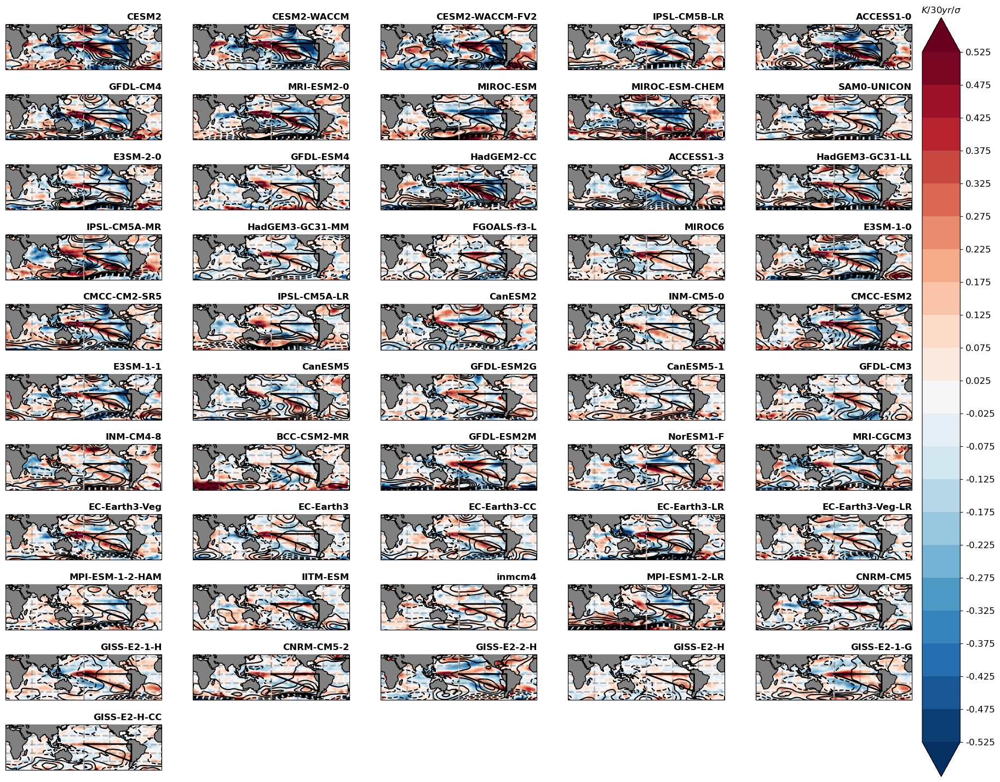

In [58]:
trend_min, trend_max, trend_step = -0.525, 0.575, 0.05
levels = np.arange(trend_min, trend_max, trend_step)
figure_SX(
    SEB_CMIP_1sig_model.sel(model=sorted_models),
    levels, 
    cvar="CLD_SW",
    include_winds=False, 
    include_psl=True, 
    save_name="manuscript_figures/SI_Figures/Figures_SX_CLD-SW_models_contours_update.png")

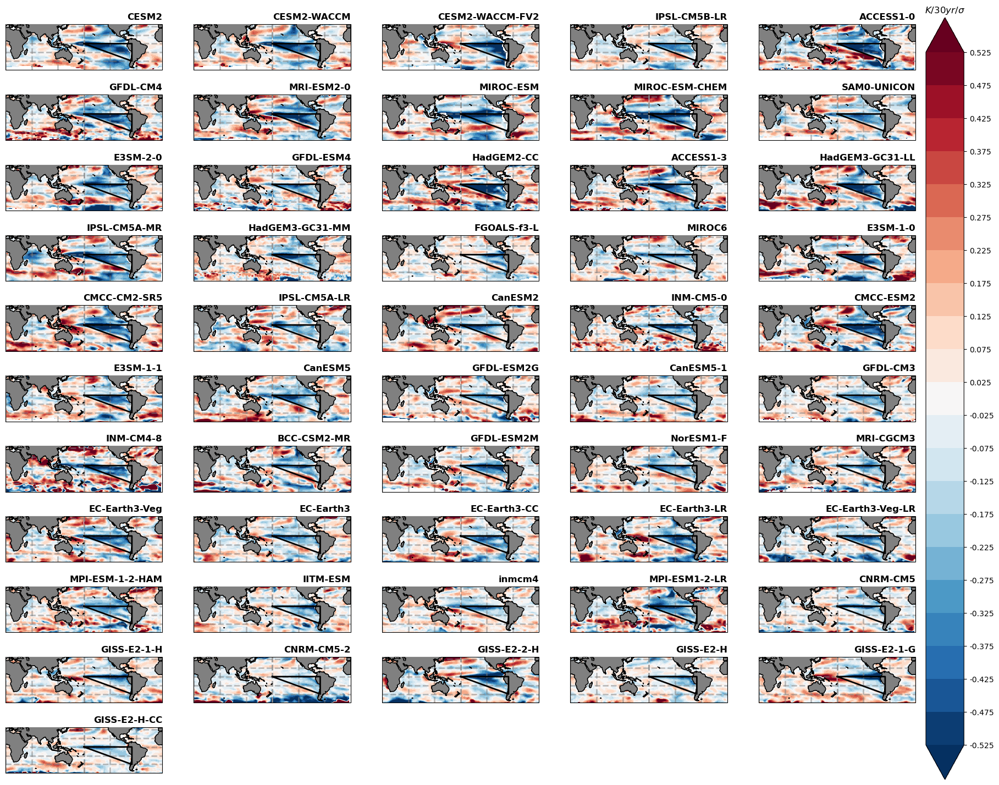

In [56]:
trend_min, trend_max, trend_step = -0.525, 0.575, 0.05
levels = np.arange(trend_min, trend_max, trend_step)
figure_SX(
    SEB_CMIP_1sig_model.sel(model=sorted_models),
    levels, 
    cvar="NET",
    include_winds=False, 
    include_psl=False, 
    save_name="manuscript_figures/SI_Figures/Figures_SX_NET_models.png")